In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import regex as reg
from mpl_toolkits.basemap import Basemap
from networkx.algorithms.community import greedy_modularity_communities
from matplotlib.colors import ListedColormap
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [2]:
import plotly.plotly as py
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode()

Loading the data about universities:

In [3]:
universities = pd.read_pickle('data/Universities.pkl')
universities.head()

,file,name,domain,email,author_order,country,Lat,Lon
0,import2018_371,University of Colorado at Boulder,colorado.edu,rebecca.swanson@colorado.edu,0,United States,40.006667,-105.267222
1,import2018_371,University of Colorado at Boulder,colorado.edu,leighanna.hinojosa@colorado.edu,1,United States,40.006667,-105.267222
2,import2018_371,University of Colorado at Boulder,colorado.edu,joseph.polman@colorado.edu,2,United States,40.006667,-105.267222
3,import2018_417,Indiana University at Bloomington,indiana.edu,huang220@indiana.edu,0,United States,39.167222,-86.521389
4,import2018_417,Indiana University at Bloomington,gmail.com,agomoll90@gmail.com,1,United States,39.167222,-86.521389


In [4]:
universities.rename(columns={'email': 'mail'}, inplace=True)

In [5]:
universities['merge_index'] = universities.apply(lambda x: x['file']+str(x['author_order']), axis=1)

metadata = pd.read_csv('data/Parsed_metadata.csv', index_col=0, parse_dates=['accessioned', 'available', 'issued'])
metadata.issued = metadata.issued.map(lambda x: x.year)
metadata['merge_index'] = metadata.apply(lambda x: x['file']+str(x['author_order']), axis=1)
associations = pd.merge(universities, metadata, on='merge_index')

In [6]:
associations.rename(columns={'file_x': 'file'}, inplace=True)

# Looking at co authorship, taking into consideration country and inst.

We use the associations frame again to build a co-authorship graph based on people with attributes country and institution

In [7]:
print(associations.columns)
#we can drop one of the file columns
(associations.file != associations.file_y).sum()

Index(['file', 'name', 'domain', 'mail', 'author_order_x', 'country', 'Lat',
       'Lon', 'merge_index', 'file_y', 'subject', 'iso', 'uri', 'type',
       'publisher', 'title', 'issued', 'accessioned', 'citation', 'available',
       'abstract', 'long_name', 'author_order_y', 'shortend_names',
       'identifier'],
      dtype='object')


0

In [8]:
associations['subject'] = associations.subject.map(lambda x: [reg.sub("'|,|\[|\]", '', y).lower().strip() for y in x.split(',')])

In [9]:
del associations['file_y']

In [10]:
associations = associations[associations.country.notna()]

In [11]:
self_merge = pd.merge(associations, associations, on='file')
self_merge = self_merge[self_merge.long_name_x != self_merge.long_name_y]

#edges = self_merge[['long_name_x', 'long_name_y', 'issued_x']].copy()

nodes = associations[~associations.long_name.duplicated()].reset_index(drop=True).reset_index()
name_index = nodes.long_name.to_dict()
name_index = {v: k for k, v in name_index.items()}

In [12]:
self_merge['source'] = self_merge.long_name_x.map(name_index)
self_merge['target'] = self_merge.long_name_y.map(name_index)

In [13]:
def get_adjacency(nodes, edges):
    n_nodes = len(nodes)
    adjacency = np.zeros((n_nodes, n_nodes), dtype=int)

    for idx, row in edges.iterrows():
        i, j = int(row.source), int(row.target)
        adjacency[i, j] += 1

    return adjacency

In [14]:
adjacency = get_adjacency(nodes, self_merge)
graph = nx.from_numpy_array(adjacency)

Adding attributes to the graph:

In [15]:
edge_dict = {}
keyword_dict = {}
for i, row in self_merge.iterrows():
    edge_dict[(row['source'], row['target'])] =  row['issued_x']
    keyword_dict[(row['source'], row['target'])] =  row['subject_x']

In [16]:
nx.set_edge_attributes(graph, edge_dict, name='year')
nx.set_edge_attributes(graph, keyword_dict, name='keywords')
nx.set_node_attributes(graph, nodes.country.to_dict(), name='country')
nx.set_node_attributes(graph, nodes.name.to_dict(), name='uni')
mapping = nodes.long_name.to_dict()
H=nx.relabel_nodes(graph,mapping)

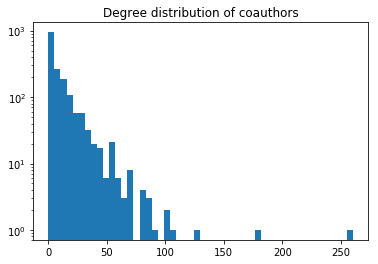

In [17]:
plt.title('Degree distribution of coauthors')
plt.hist(adjacency.sum(axis=1), bins=50, log=True)
plt.show()

This is a simple drawing of our network: we see that there is a large core communit, and many many smaller comminitues of co authors. We will look more into the main community

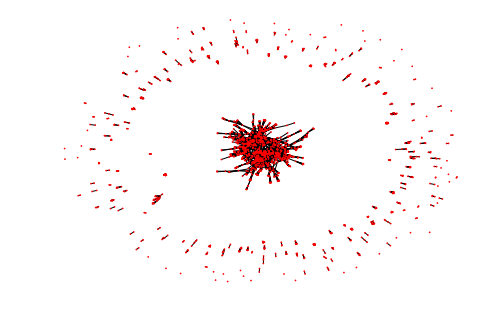

In [18]:
nx.draw(graph, pos=nx.spring_layout(graph), node_size=[0.5,0.5])

In [19]:
embedding = nodes.apply(lambda x: [x.Lon, x.Lat], axis=1)

In [20]:
weight = nx.get_edge_attributes(graph, 'weight')

We focus in on the different components:

In [21]:
#get components
largest_cc = max(nx.connected_components(graph), key=len)

The total number of components is:

In [22]:
nx.number_connected_components(graph)

209

In [23]:
print(f'the largest component contains : {len(largest_cc)} people')

the largest component contains : 1114 people


Use centrality to highlight nodes that function as "bridges" between people

In [24]:
centrality = nx.betweenness_centrality(graph.subgraph(largest_cc))

In [25]:
centrality_2 = nx.current_flow_betweenness_centrality(graph.subgraph(largest_cc))

In [26]:
np.quantile(np.array(list(centrality.values())), 0.9)

0.008964230944335065

In [27]:
lables = nodes['long_name'].to_dict()

lables = { key: lables[key] for (key, value) in centrality.items() if value > 0.03}
lables

{2: 'Polman, Joseph L',
 21: 'Fischer, Frank',
 37: 'Moher, Tom',
 38: 'Slotta, James D.',
 47: 'Peppler, Kylie A',
 63: 'Puntambekar, Sadhana',
 72: 'Shapiro, R. Benjamin',
 94: 'Oshima, Jun',
 97: 'Zhang, Jianwei',
 98: 'Chen, Mei-Hwa',
 116: 'Yoon, Susan A.',
 120: 'Danish, Joshua A.',
 132: 'Clarke, Sherice',
 146: 'Kali, Yael',
 154: 'Bielaczyc, Katerine',
 155: 'Kapur, Manu',
 179: 'Rummel, Nikol',
 240: 'Jona, Kemi',
 255: 'Tan, Michael',
 256: 'Sandoval, William A.',
 282: 'van Aalst, Jan',
 318: 'Rosé, Carolyn',
 319: 'kafai, yasmin',
 320: 'Tissenbaum, Mike',
 322: 'Telhan, Orkan',
 347: 'Nathan, Mitchell',
 417: 'Dillenbourg, Pierre',
 432: 'Hmelo-Silver, Cindy E.',
 461: 'Chan, Carol K.K.',
 548: 'Hall, Rogers',
 595: 'Penuel, William',
 605: 'Bang, Megan',
 1152: 'Lund, Kristine',
 1153: 'Radinsky, Josh',
 1252: 'Barma, Sylvie',
 1366: 'Laferrière, Thérèse',
 1444: 'Kirschner, Paul'}

In [28]:
node_size = np.array(list(centrality.values()))*5000

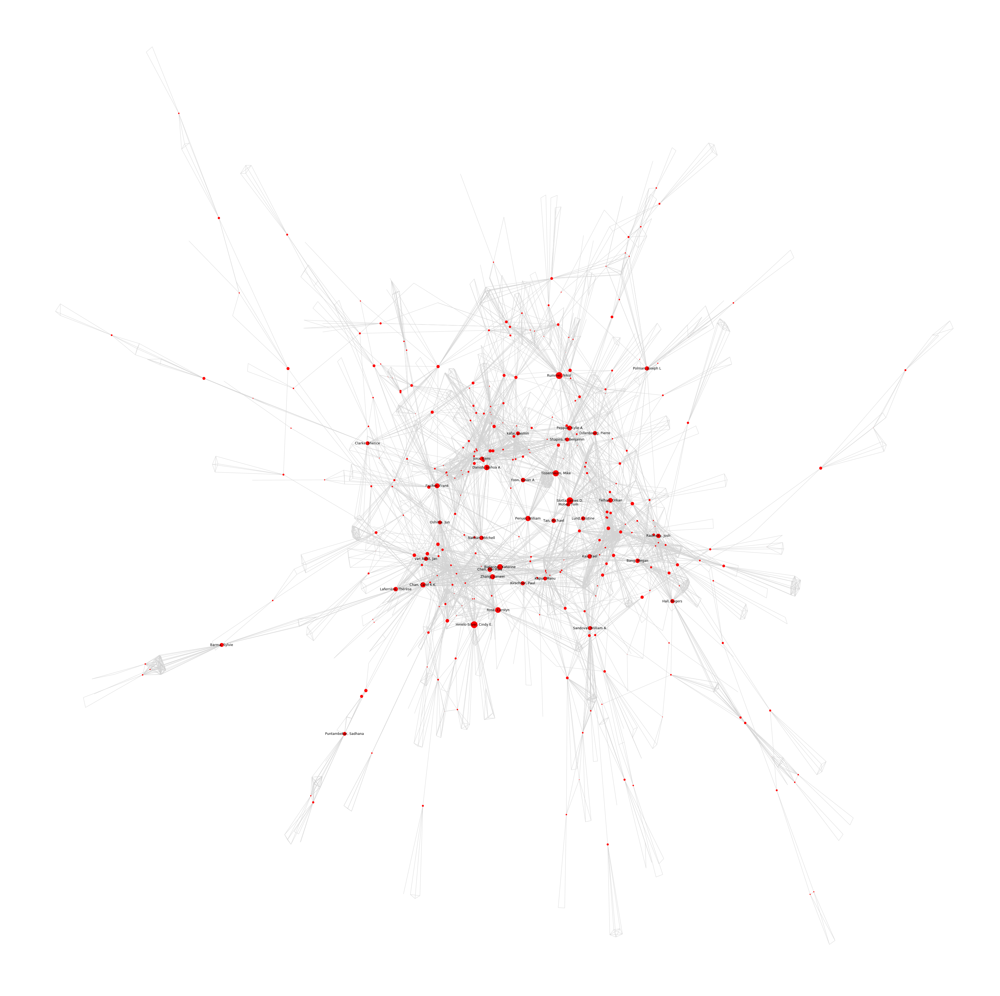

In [29]:
plt.figure(figsize=(50, 50))
nx.draw(graph.subgraph(largest_cc), node_size=node_size, edge_color='lightgray', labels=lables)

**Same graph for people who collaborated at least on 3 papers:**

e.g. we look at frequent collaborators (also forming a main component)

In [30]:
G = nx.Graph(((source, target, attr) for source, target, attr in graph.edges(data=True) if attr['weight'] > 2))
nx.set_node_attributes(G, nodes.country.to_dict(), name='country')
nx.set_node_attributes(G, nodes.name.to_dict(), name='uni')


largest_ccs = [i for i in nx.connected_components(G) if len(i) > 9]
len(largest_ccs)

5

In [31]:
palette = sns.color_palette(palette='tab20', n_colors=10).as_hex()

In [32]:
palette

['#1f77b4',
 '#aec7e8',
 '#ff7f0e',
 '#ffbb78',
 '#2ca02c',
 '#98df8a',
 '#d62728',
 '#ff9896',
 '#9467bd',
 '#c5b0d5']

In [33]:
import matplotlib.patches as mpatches

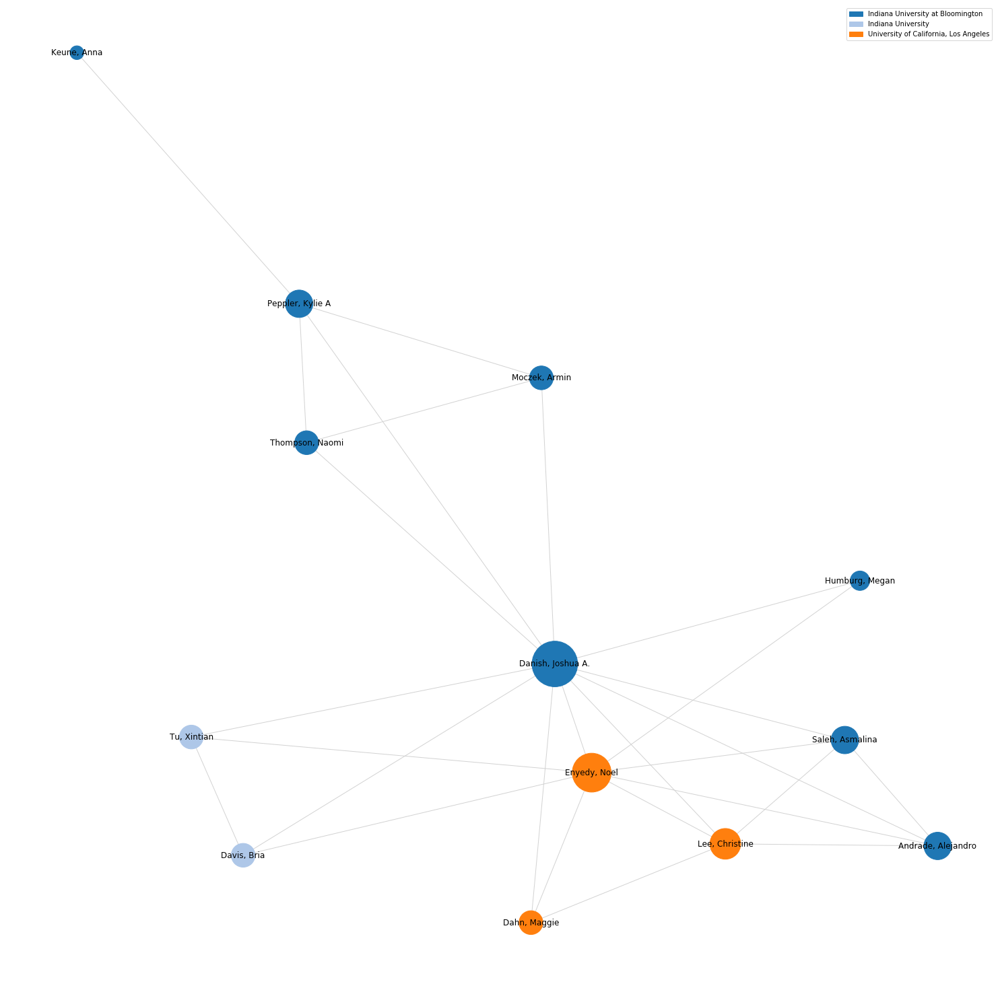

mixed reality               1
elementary school           1
participatory simulation    1
making                      1
technology                  1
early elementary            1
science inquiry             1
situated learning           1
science education           1
games                       1
online communities          1
science                     1
connected learning          1
embodied cognition          1
embodiment                  1
collaboration               1
playful learning            1
play                        1
dtype: int64


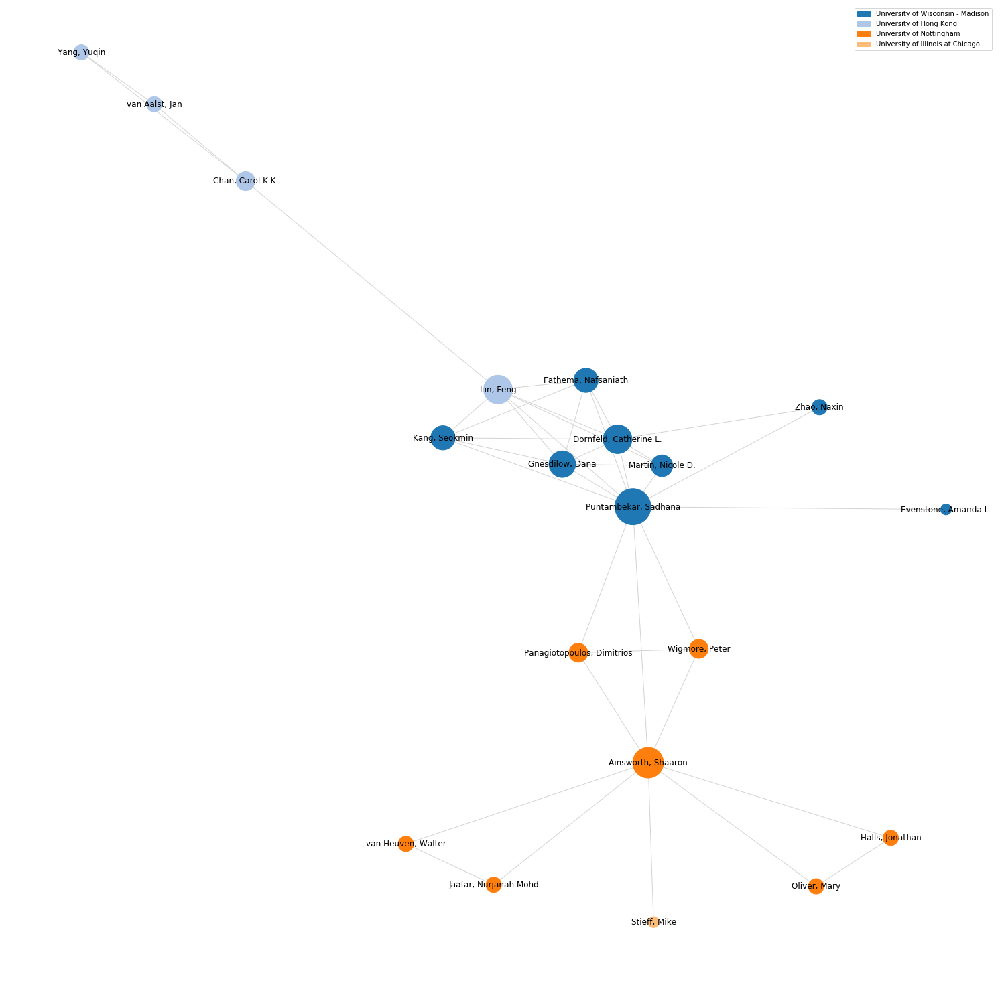

science education                          3
science learning                           2
eye movements                              1
reflection                                 1
knowledge building                         1
text-picture integration                   1
kbdex                                      1
science                                    1
collaboration skills                       1
drawing                                    1
stakeholder analysis                       1
competence/expertise                       1
epistemic reflection                       1
digital text                               1
young children                             1
learning analytics and monitoring tools    1
teleological reasoning                     1
reading in a second language               1
skill development                          1
information analysis                       1
small group                                1
inquiry learning                           1
participat

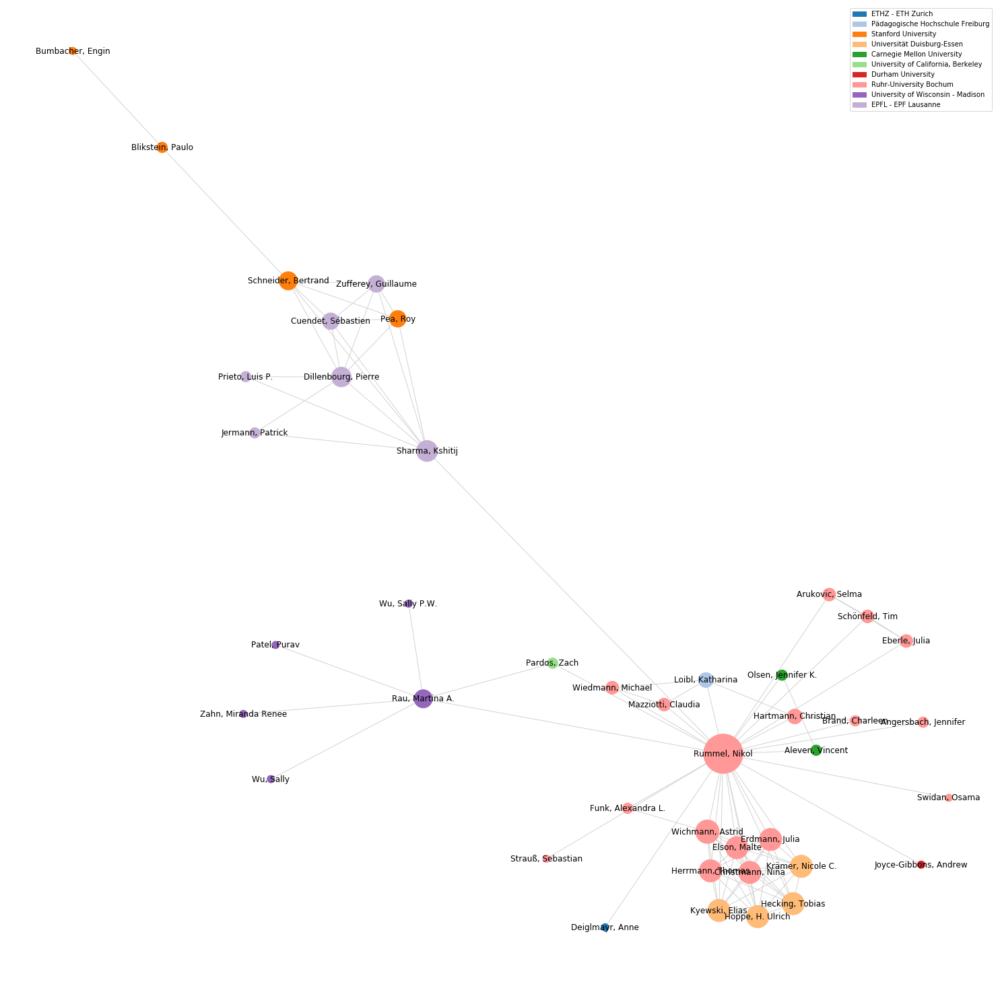

conceptual knowledge                    2
scaffolding                             2
eye-tracking                            2
collaboration                           2
collaborative learning                  2
intelligent tutoring systems            2
productive failure                      2
participatory design                    2
sense making                            1
duet                                    1
collaborative problem solving skills    1
satisfaction                            1
mediation                               1
modeling                                1
interactive biology                     1
constructivism                          1
representational competencies           1
inquiry strategy                        1
computing education                     1
design issues                           1
peer assessment                         1
secondary school                        1
procedural knowledge                    1
tangible user interface           

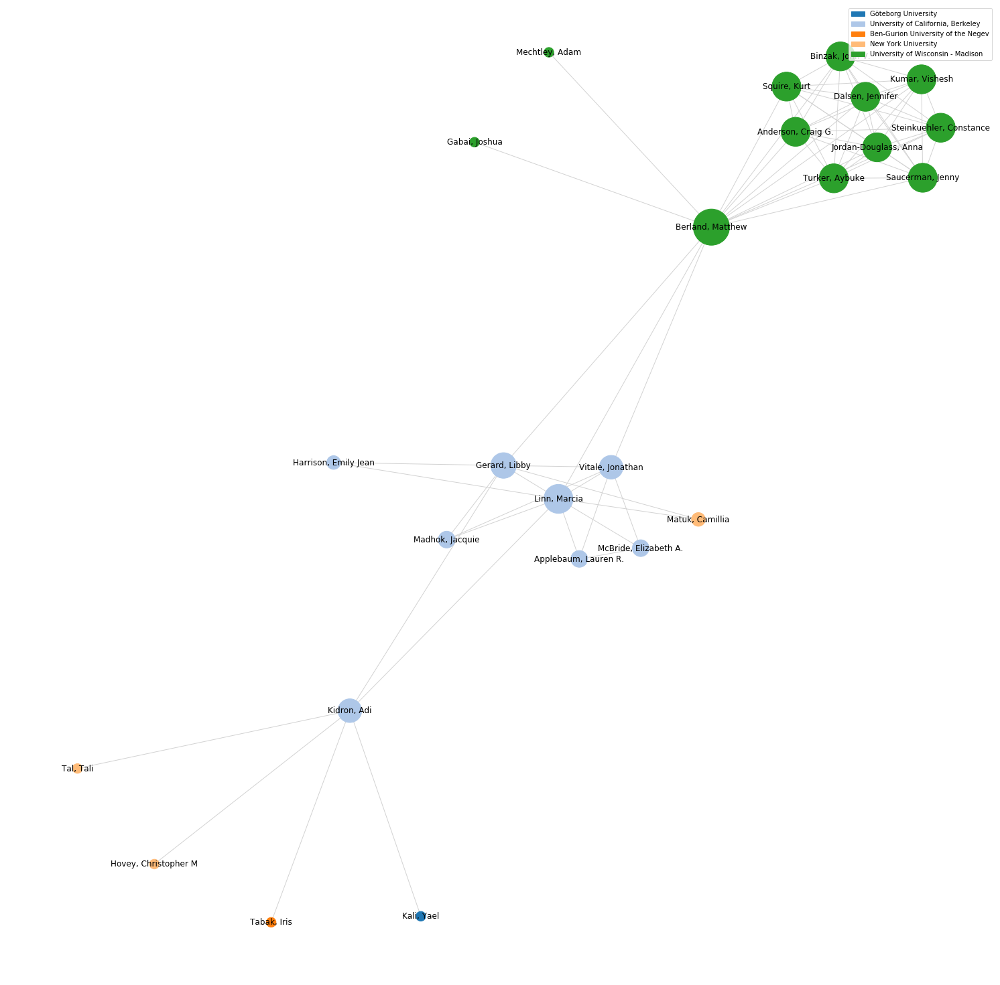

technology                       3
design                           3
stem                             2
cognition                        1
game-based learning              1
educational games                1
design thinking                  1
& knowledge integration          1
role-playing game                1
virtual communities              1
technical proof of concept       1
virtual models                   1
computer models                  1
knowledge integration            1
big data                         1
graphing                         1
inquiry                          1
games and learning               1
real-time data                   1
science practices                1
revision                         1
writing                          1
information visualization        1
epistemic cognition              1
student learning                 1
educational technology           1
design-based research            1
mixed methods                    1
education technology

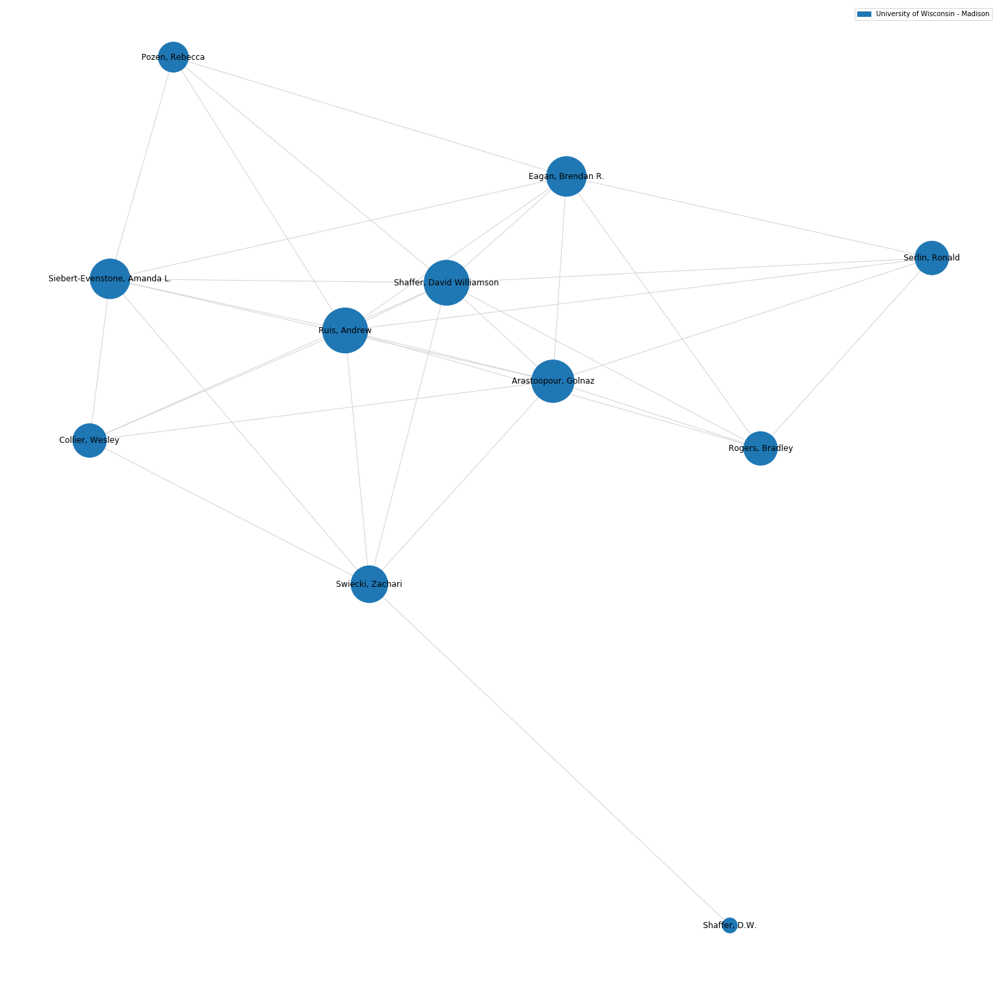

epistemic network analysis    3
discourse analysis            2
segmentation                  1
design                        1
identity and community        1
self-regulated learning       1
data visualization            1
participant structures        1
moving window                 1
sliding window                1
reflection                    1
epistemology                  1
motivation                    1
team performance              1
dtype: int64


In [34]:
for largest_cc_strong in largest_ccs:
    
    helper = list(set(nx.get_node_attributes(
        G.subgraph(largest_cc_strong), 'uni').values()))
    node_color = [palette[helper.index(i)] for i in nx.get_node_attributes(
        G.subgraph(largest_cc_strong), 'uni').values()]
    
    plt.figure(figsize=(20, 20))
    
    node_size = np.array(list(nx.degree_centrality(G.subgraph(largest_cc_strong)).values()))

    lables = nodes.iloc[list(largest_cc_strong)]['long_name'].to_dict()
    nx.draw_spring(G.subgraph(largest_cc_strong), node_size=node_size*5000, labels=lables, edge_color='lightgray',
                  node_color=node_color)
    #draw legend
    legend = []
    for ind, name in enumerate(helper):
        legend.append(mpatches.Patch(color=palette[ind], label=name))
    plt.legend(handles=legend)
    
    plt.show()
    keywords = pd.Series(list(nx.get_edge_attributes(G.subgraph(largest_cc_strong), 'keywords').values()))
    keywords = pd.Series([i for j in keywords[
        ~keywords.map(lambda x : ''.join(x)).duplicated()].tolist() for i in j]).value_counts()
    print(keywords)

Drawing it in a geographical embedding:

#### Collaboration in the graph over the years:

In [36]:
edges = self_merge[['long_name_x', 'long_name_y', 'issued_x']].drop_duplicates()
counts = edges.groupby(['long_name_x', 'long_name_y']).count()
counts.issued_x.value_counts()

1    12412
2      622
3      110
4       16
Name: issued_x, dtype: int64

In [37]:
edge_dict = {}
keyword_dict = {}
for i, row in counts[counts.issued_x > 1].reset_index().iterrows():
    keywords = self_merge[(self_merge.long_name_x == row.long_name_x) & 
                     (self_merge.long_name_y == row.long_name_y)].subject_x
    keywords = [i for j in keywords[
        ~keywords.map(lambda x : ''.join(x)).duplicated()].tolist() for i in j if len(i) > 0]
    keyword_dict[(row.long_name_x, row.long_name_y)] = keywords

In [38]:
G = nx.from_pandas_edgelist(counts[counts.issued_x > 1].reset_index(), 
                        source='long_name_x', target='long_name_y', edge_attr=['issued_x'])
nx.set_node_attributes(G, nodes.set_index('long_name').country.to_dict(), name='country')
nx.set_node_attributes(G, nodes.set_index('long_name').name.to_dict(), name='uni')
nx.set_edge_attributes(G, keyword_dict, name='keywords')

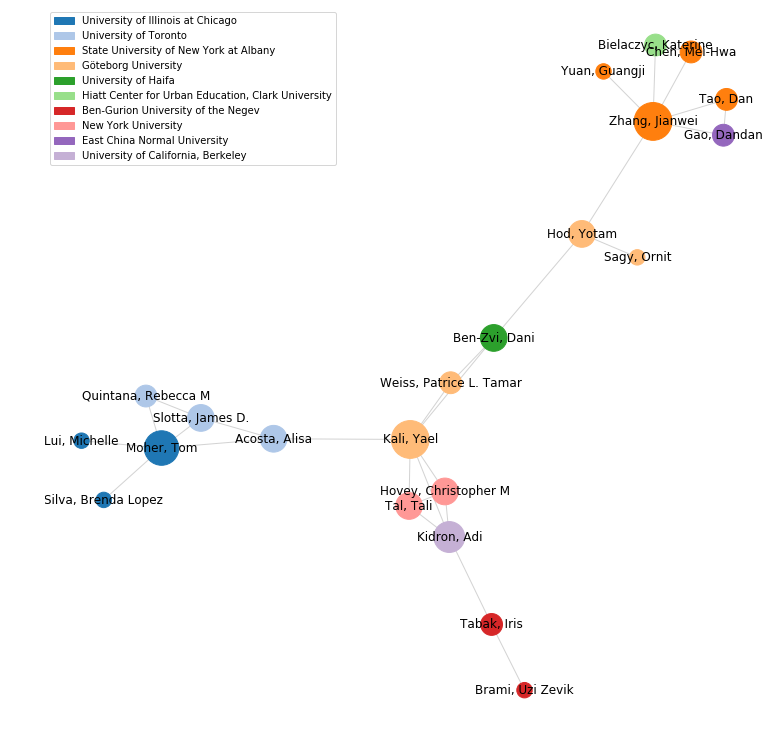

design                                     16
learning communities                       15
sociocultural                              11
future learning spaces                     10
knowledge building                          5
interaction analysis                        4
learning outcomes                           4
collaborative inquiry                       4
primary school                              4
instrumented learning environments          4
educational psychology                      4
innovative design approach                  4
networked society                           4
visual evidence                             4
location-tracking technologies              4
education technology                        4
mobile applications                         4
developmental psychology                    3
multi-touch devices                         3
discovery learning                          3
early childhood education                   3
online learning                   

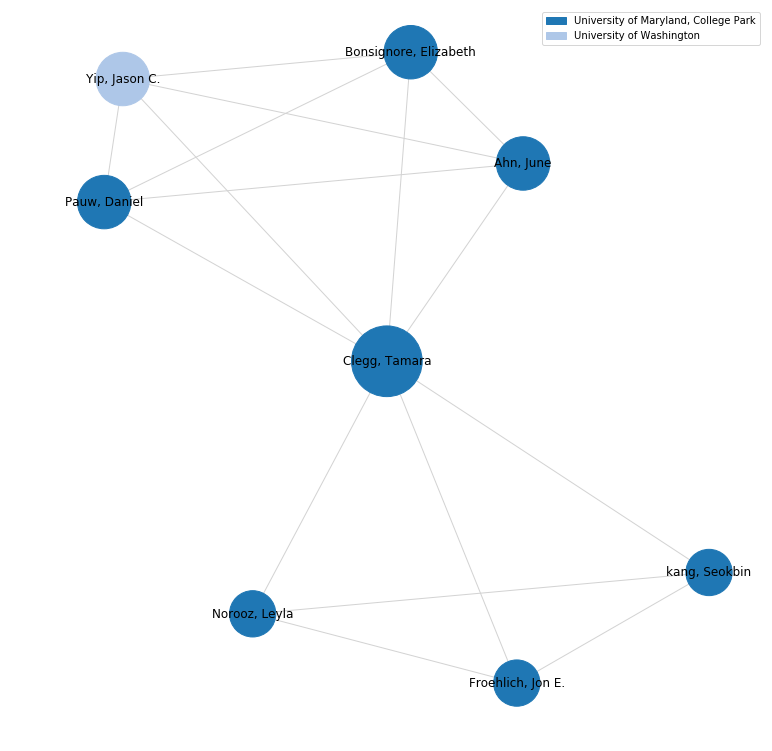

connected learning         4
stem                       2
inquiry                    2
educational technology     2
social media               2
science inquiry            2
learning practices         2
adult learning             1
scaffolding                1
design-based research      1
informal learning          1
affordances                1
embodied learning          1
lpsv tools                 1
physiological sensing      1
wearable-based inquiry     1
affinity spaces            1
environmental education    1
interaction analyses       1
dtype: int64


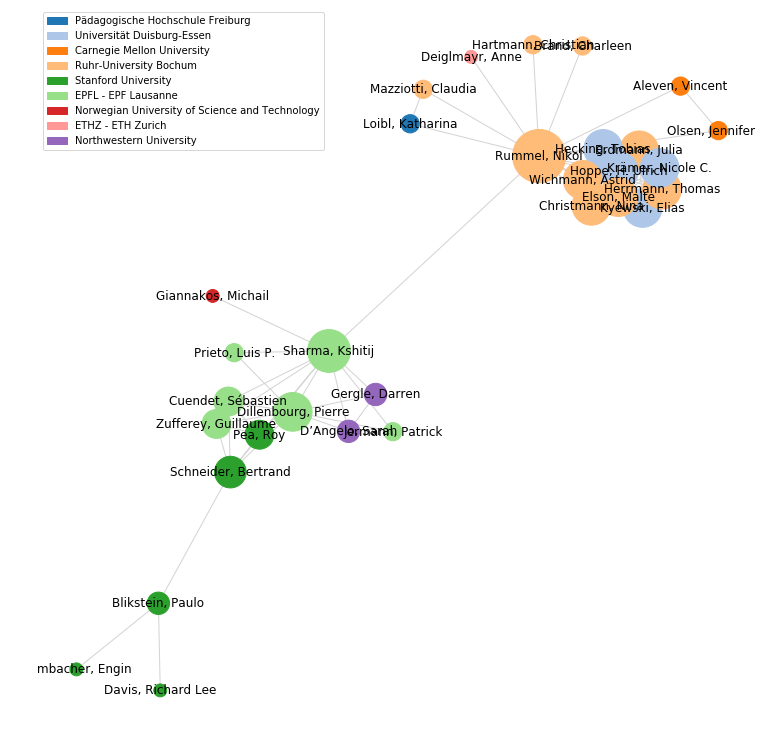

eye-tracking                                    11
collaborative learning                          10
primary school                                   9
intelligent tutoring systems                     8
mooc                                             7
productive failure                               7
e-learning                                       6
collaboration                                    6
participatory design                             6
learning analytics                               5
secondary school                                 5
conceptual knowledge                             5
computer science                                 5
contextual design                                4
mathematics                                      4
tangible user interface                          4
descriptive studies                              4
instructional science                            3
exploratory learning environments                3
instructional design           

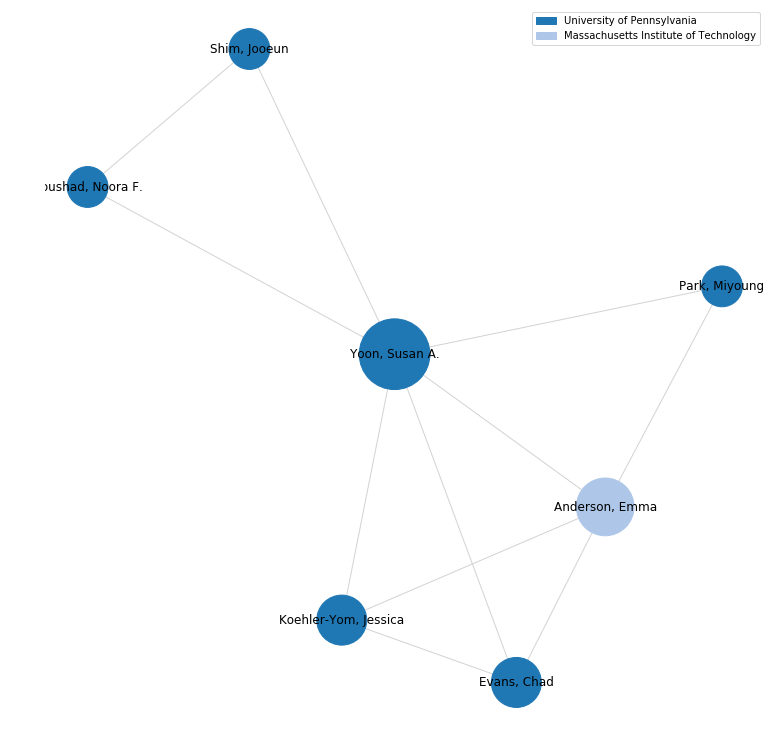

learning outcomes                               5
science education                               5
complex systems                                 3
innovative design approach                      3
ngss                                            3
teaching                                        3
computer supported curricula                    3
simulations                                     2
learning analytics / educational data mining    2
argumentation                                   2
evidence                                        2
education                                       2
computer science                                2
problem-based learning                          2
video analysis                                  2
representational affordances                    1
group cognition                                 1
social networking (facebook                     1
descriptive studies                             1
trade-offs                                      1


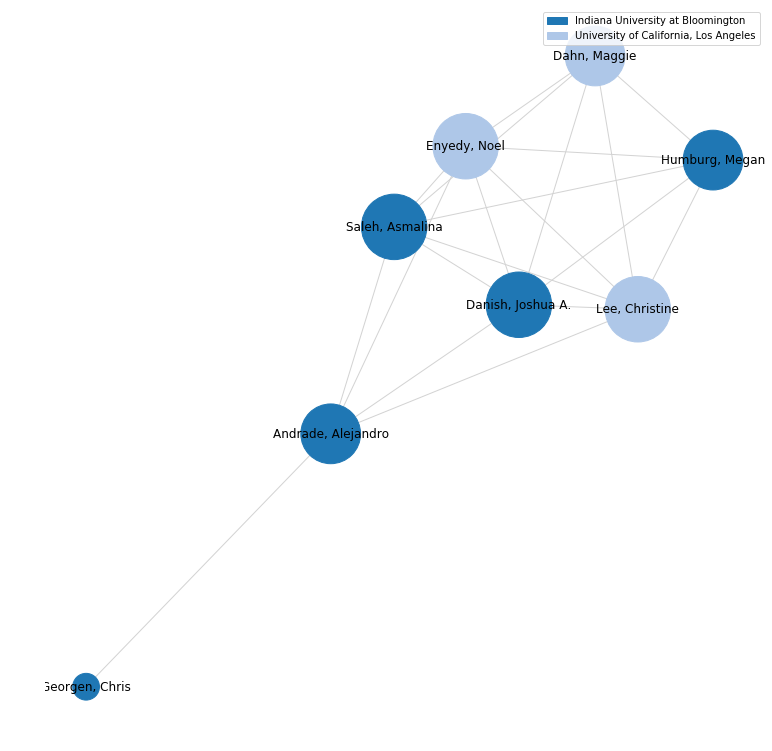

design-based research                  13
science & math                         10
embodied learning                      10
play                                    8
games                                   8
embodied cognition                      8
science inquiry                         8
young children                          7
technology                              5
mixed reality                           5
science teaching                        4
embodiment                              4
elementary school                       4
science education                       4
interaction analyses                    3
assessments                             3
multi-modality                          3
affordances                             3
science                                 2
inquiry                                 2
improvisation                           2
science teacher education               2
engagement                              1
interaction tool                  

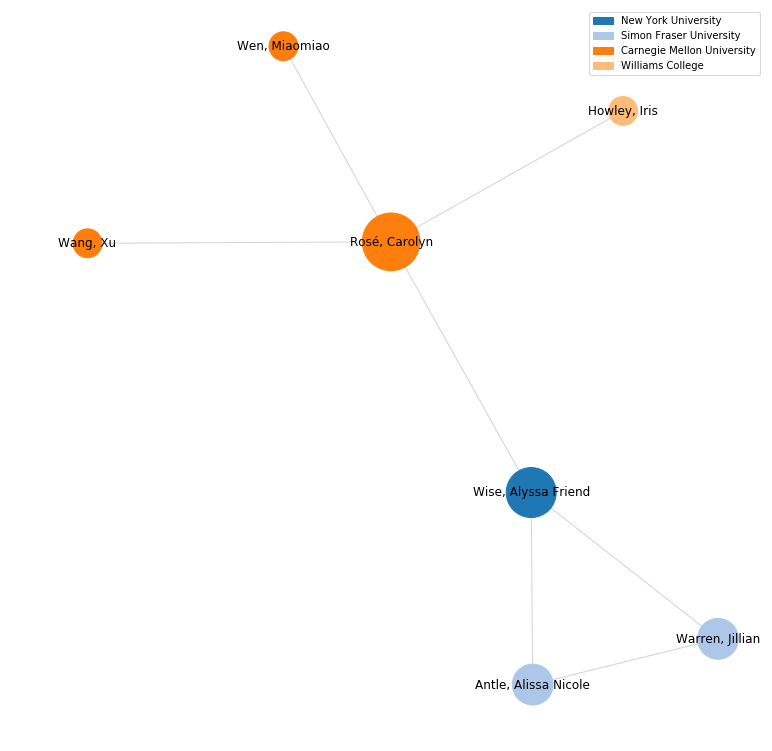

prompting                                 2
stakeholder analysis                      2
socially shared regulation of learning    2
inquiry learning                          2
scaffolding                               2
mooc                                      2
expectancy value theory                   1
positive interdependence                  1
tangible systems                          1
survey                                    1
education technology                      1
writing                                   1
cscl                                      1
discussion affordances                    1
massive open online courses               1
reasoning                                 1
motivation                                1
design-based research                     1
mathematics education                     1
teacher education                         1
emergent dialogue                         1
student roles                             1
dtype: int64


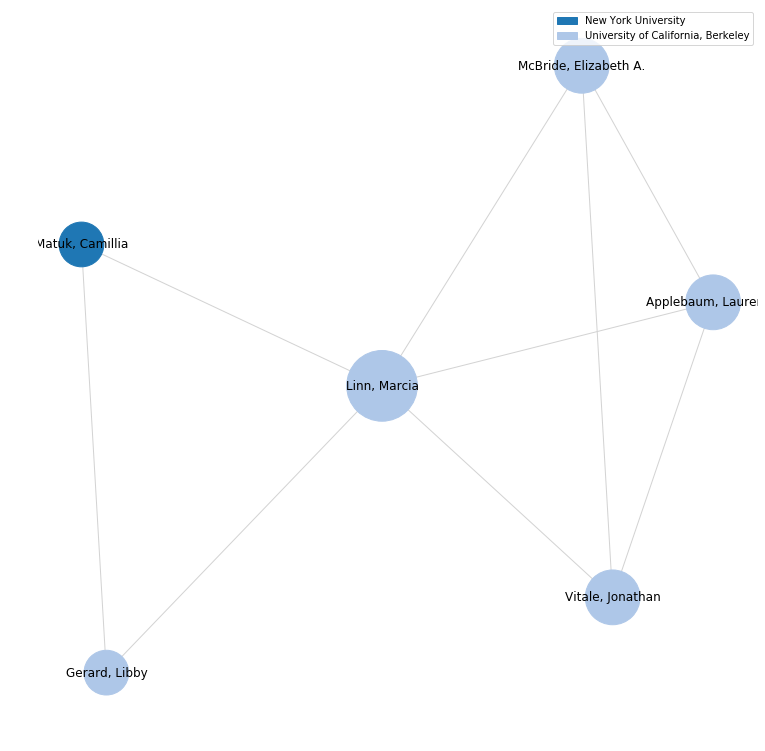

design                           7
interaction tool                 6
technology                       6
education technology             5
design-based research            5
situated learning                4
teacher education                4
real-time data                   4
competence/expertise             4
computer models                  4
innovative software/artifacts    4
university                       4
case-based instruction           4
simulations                      4
core competencies                4
knowledge integration            4
participatory simulations        4
classroom orchestration          4
information visualization        4
cscl                             3
stem                             3
virtual/3d environments          2
design thinking                  2
research methodologies           2
literacy                         2
technology & education           2
cognition                        2
technical proof of concept       2
virtual models      

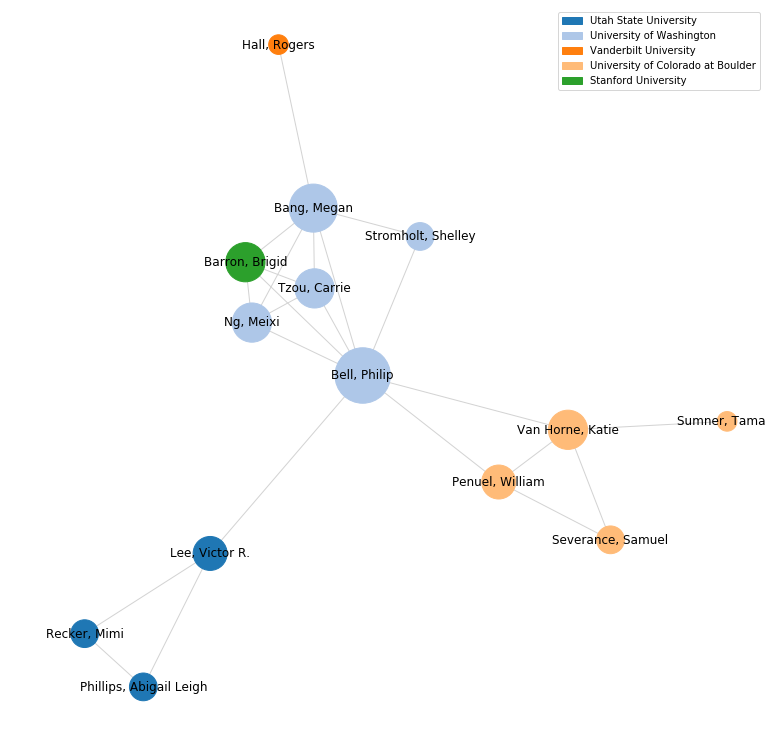

design-based research                                7
science                                              7
expansive science learning                           6
co-design                                            6
design-based implementation research                 6
student affect                                       3
coherence                                            3
practical measurement                                3
project-based learning                               3
equity                                               2
classroom assessment                                 2
equitable design                                     2
actor network mapping                                2
multi-dimensional learning                           2
axiological innovations                              2
family learning                                      2
interests                                            2
engineering                                          1
libraries 

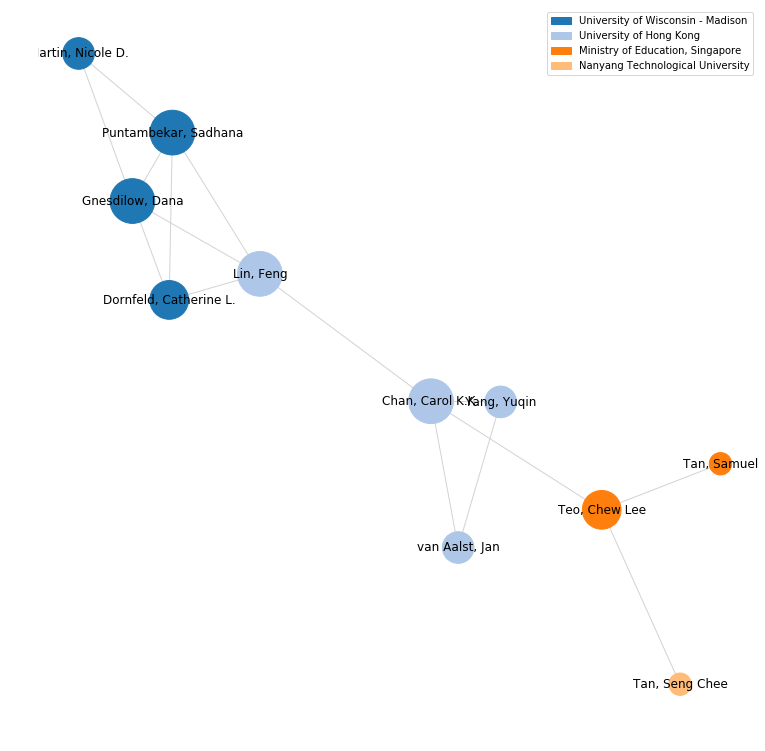

knowledge building                         13
science education                          10
science learning                            8
digital text                                5
epistemic reflection                        5
collaboration                               4
symmetrical peers                           3
physical experimentation                    3
teacher mediation                           3
kbdex                                       3
k-12 education                              3
students with low achievement               3
reflective assessment                       3
inquiry learning                            3
learning analytics and monitoring tools     3
virtual experimentation                     3
activity systems analysis                   3
scaffolding                                 3
small group                                 3
metacogition                                3
cscl discourse                              2
learning                          

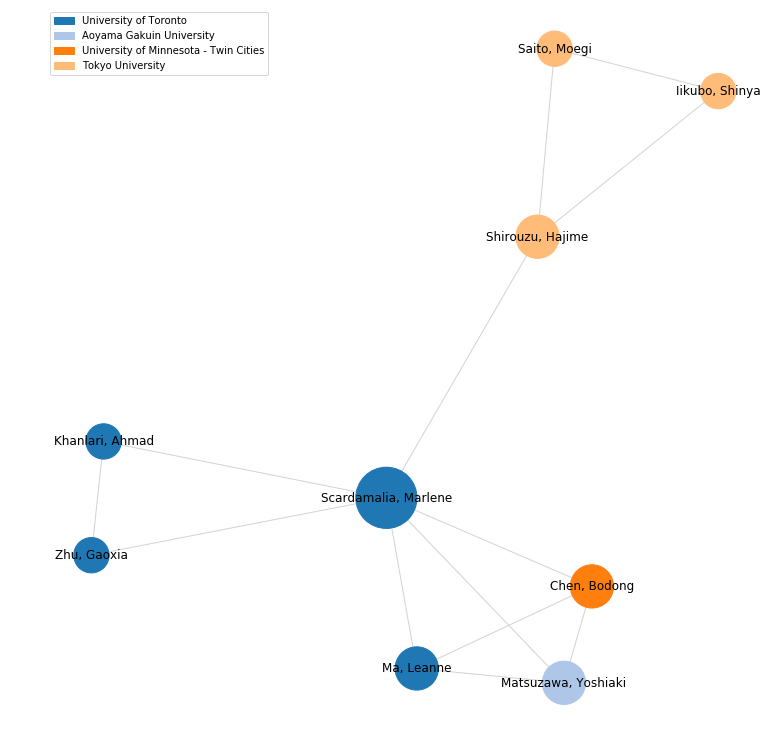

knowledge building                      4
knowledge constructive jigsaw           4
dbir                                    3
science education                       2
scaling-up                              2
constructivism/constructionism          1
collaborative innovation network        1
authoring tool                          1
engagement                              1
scaffolding                             1
conceptual change                       1
argumentation                           1
innovation                              1
cross-curricular                        1
crosscutting concepts                   1
culturally relevant pedagogy/design     1
representational affordances            1
artifact analysis                       1
contextual design                       1
literacy development                    1
cscl                                    1
design-based implementation research    1
education technology                    1
situated learning                 

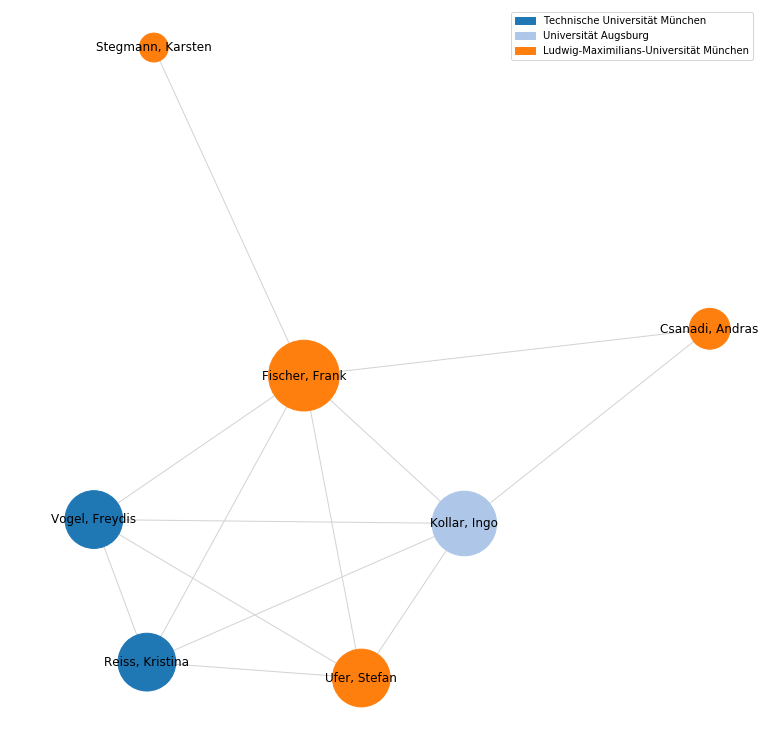

argumentation                             7
mathematics                               6
scientific reasoning                      4
collaboration scripts                     3
user interface                            2
epistemic activities                      2
computer science                          2
automated coding                          2
collaborative problem solving             2
scaffolding                               2
group composition                         2
intelligent systems                       2
educational psychology                    1
skill development                         1
gaming                                    1
design-based research                     1
mathematics education                     1
primary school                            1
participatory design                      1
problem-based learning                    1
science education                         1
virtual/3d environments                   1
prompting                       

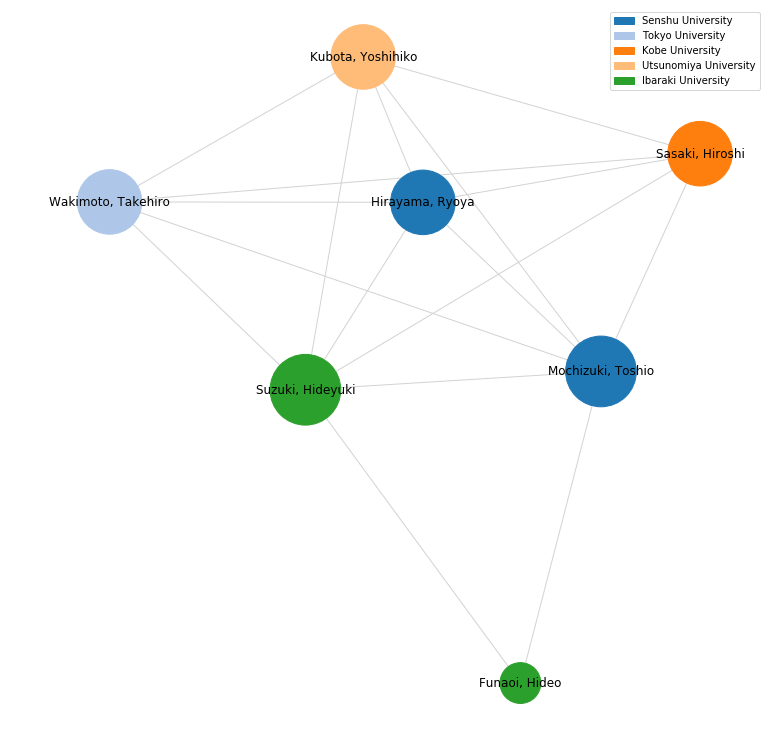

scaffolding                     3
simulations                     3
representational affordances    3
video analysis                  3
informal learning settings      3
online learning                 3
social network analysis         2
puppetry                        2
digital story telling           2
teacher education               2
perspective-taking              2
reflection                      2
dtype: int64


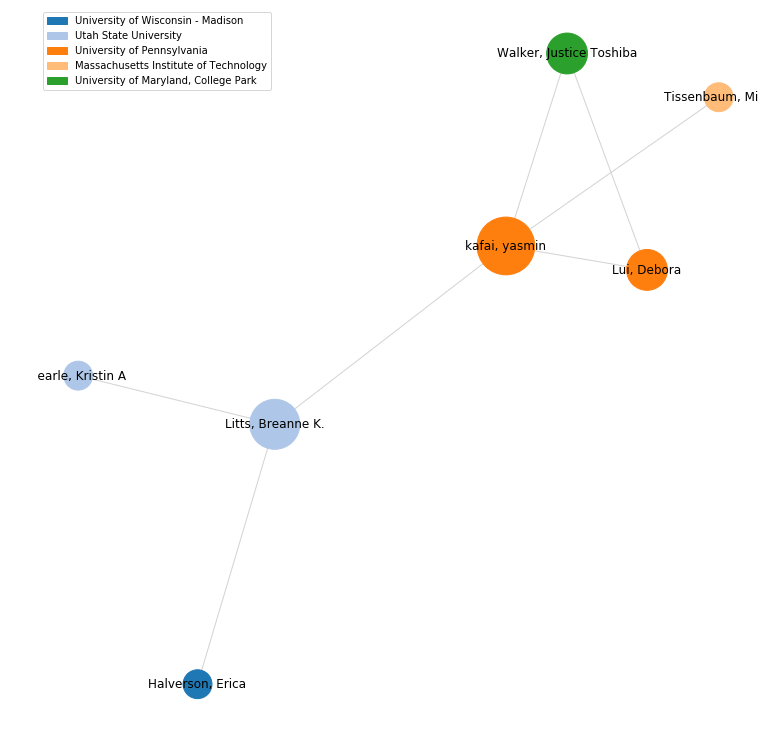

making                      5
connected learning          3
online communities          3
collaboration               3
broadening participation    3
classroom                   2
productive failure          2
interaction analyses        2
case study                  2
learning through making     2
design-based research       2
assessment                  2
affordances                 2
electronic textiles         2
computational thinking      2
learning designs            2
constructionism             1
project-based learning      1
indigenous                  1
place-based learning        1
dtype: int64


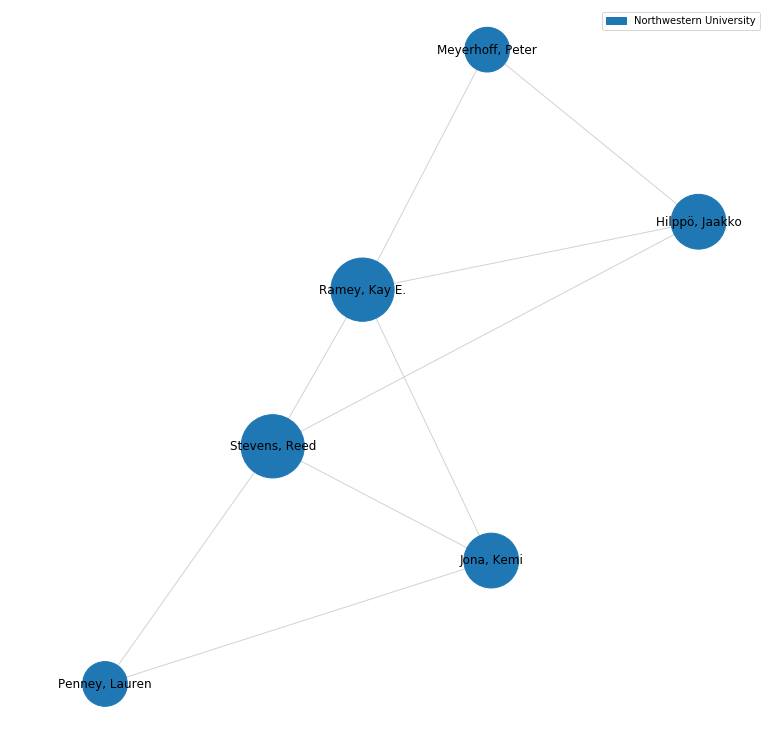

self-directed learning      5
situated learning           5
informal learning           5
relative expertise          5
agency                      5
video                       2
data representation         2
qualitative                 2
analysis                    2
methods                     2
spatial thinking            1
interest-driven learning    1
makerspace                  1
design                      1
technology                  1
design-based research       1
scaffolds                   1
interaction analysis        1
stem                        1
programming                 1
dtype: int64


In [39]:
largest_cc_strong = [i for i in list(nx.connected_components(G)) if len(i) > 5]

for subgraph in largest_cc_strong:
    data = associations[associations.long_name.isin(list(subgraph)) & ~associations.long_name.duplicated()]
    G_ = G.subgraph(subgraph)
    
    helper = list(data.name.unique())
    node_size = np.array(list(nx.degree_centrality(G_).values()))
    node_color = [palette[helper.index(i)] for i in nx.get_node_attributes(G_, 'uni').values()]
    
    plt.figure(figsize=(10, 10))
    
    nx.draw_spring(G_, node_size=node_size*5000, with_labels=True, edge_color='lightgray', 
                   node_color = node_color, cmap=plt.cm.Set1)

    legend = []
    for ind, name in enumerate(helper):
        legend.append(mpatches.Patch(color=palette[ind], label=name))
    plt.legend(handles=legend)
    plt.show()
    
    keywords = pd.Series(list(nx.get_edge_attributes(G.subgraph(subgraph), 'keywords').values()))
    keywords = pd.Series([i for j in keywords[
        ~keywords.map(lambda x : ''.join(x)).duplicated()].tolist() for i in j]).value_counts()
    print(keywords)

## collaboration over one years

In [40]:
G = nx.Graph(((source, target, attr) for source, target, attr in graph.edges(data=True) 
              if attr['year'] > 2017 and attr['weight'] > 3))
largest_cc_strong = max(nx.connected_components(G), key=len)
len(largest_cc_strong)

9

Series([], Name: name, dtype: int64)


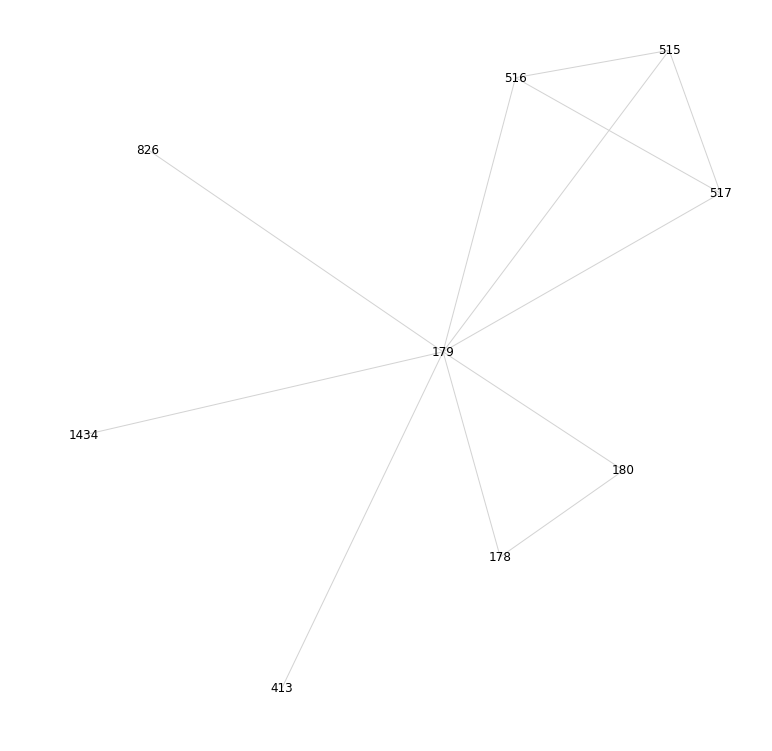

Series([], Name: name, dtype: int64)


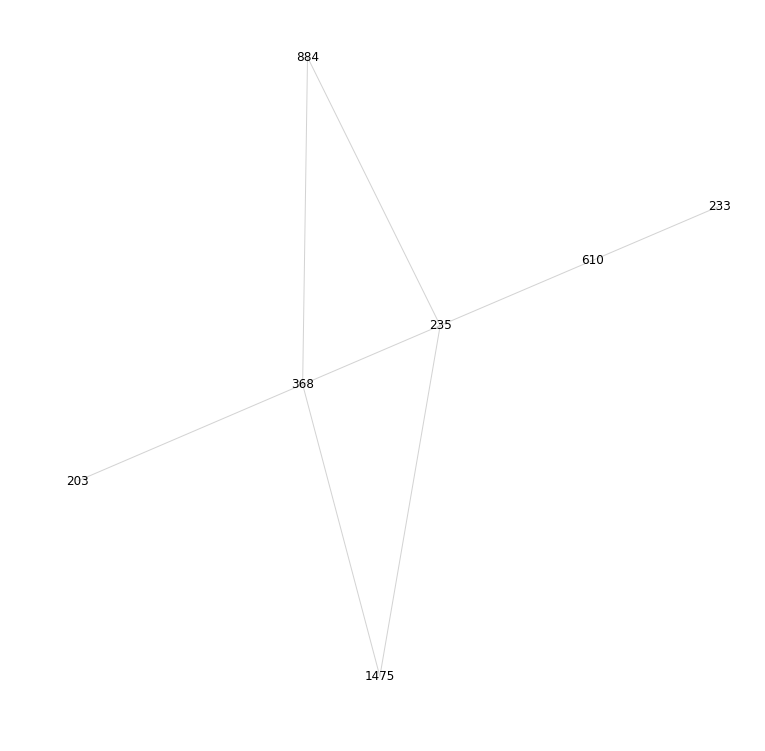

In [41]:
largest_cc_strong = [i for i in list(nx.connected_components(G)) if len(i) > 5]

for subgraph in largest_cc_strong:
    data = associations[associations.long_name.isin(list(subgraph)) & ~associations.long_name.duplicated()]
    G_ = G.subgraph(subgraph)
    
    helper = list(data.name.unique())
    node_size = np.array(list(nx.degree_centrality(G_).values()))
    node_color = [palette[helper.index(i)] for i in nx.get_node_attributes(G_, 'uni').values()]
    
    plt.figure(figsize=(10, 10))
    
    nx.draw_spring(G_, node_size=node_size*5000, with_labels=True, edge_color='lightgray', 
                   node_color = node_color, cmap=plt.cm.Set1)
    print(data.name.value_counts())
    plt.show()

### Who colaborates the most:

We can easely find the people who worked with the most other people:
(counting repeat collaboration)

In [42]:
nodes['collabs_weighted'] = adjacency.sum(axis=1)
nodes.sort_values(by='collabs_weighted', ascending=False)[['long_name', 'country', 'name', 'collabs_weighted']].head(10)

,long_name,country,name,collabs_weighted
179,"Rummel, Nikol",Germany,Ruhr-University Bochum,260
235,"Linn, Marcia",United States,"University of California, Berkeley",178
63,"Puntambekar, Sadhana",United States,University of Wisconsin - Madison,126
368,"Gerard, Libby",United States,"University of California, Berkeley",104
233,"Vitale, Jonathan",United States,"University of California, Berkeley",100
154,"Bielaczyc, Katerine",United States,"Hiatt Center for Urban Education, Clark Univer...",100
38,"Slotta, James D.",Canada,University of Toronto,91
388,"Abrahamson, Dor",United States,"University of California, Berkeley",86
97,"Zhang, Jianwei",United States,State University of New York at Albany,86
120,"Danish, Joshua A.",United States,Indiana University at Bloomington,85


Same as above but counting person only once:

In [43]:
nodes['collabs_unweighted'] = np.where(adjacency > 0, 1, 0).sum(axis=1)
nodes.sort_values(by='collabs_unweighted', ascending=False)[['long_name', 'country', 'name', 'collabs_unweighted']].head(10)

,long_name,country,name,collabs_unweighted
146,"Kali, Yael",Sweden,Göteborg University,62
179,"Rummel, Nikol",Germany,Ruhr-University Bochum,60
38,"Slotta, James D.",Canada,University of Toronto,60
97,"Zhang, Jianwei",United States,State University of New York at Albany,59
98,"Chen, Mei-Hwa",United States,State University of New York at Albany,54
39,"Acosta, Alisa",Canada,University of Toronto,54
318,"Rosé, Carolyn",United States,Carnegie Mellon University,53
595,"Penuel, William",United States,University of Colorado at Boulder,53
605,"Bang, Megan",United States,University of Washington,50
319,"kafai, yasmin",United States,University of Pennsylvania,50


### Zooming into largest community: - country & institution

In [44]:
main_component = nodes[nodes.index.isin(largest_cc)]

Comparing the country representation in main component to the one overall.

Text(0, 0.5, 'Counts')

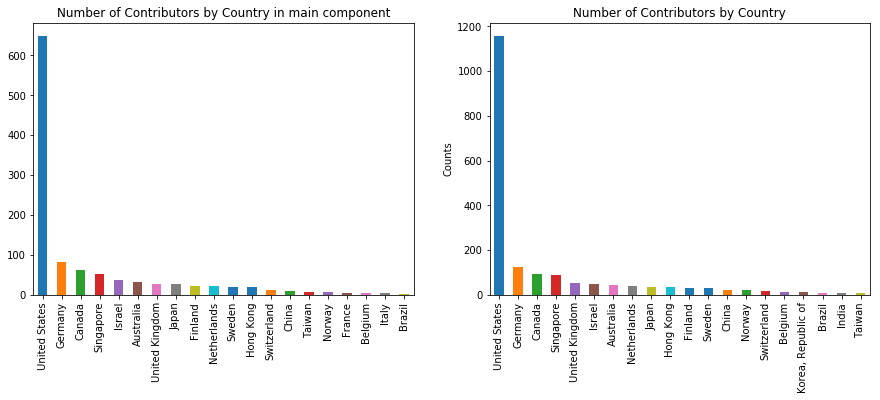

In [45]:
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.title('Number of Contributors by Country in main component')
main_component.country.value_counts().head(20).plot(kind='bar')
plt.subplot(122)
universities[(~universities.mail.duplicated())].country.value_counts().head(20).plot(kind = 'bar')
plt.title('Number of Contributors by Country') # as determinded by university affiliation
plt.ylabel('Counts')

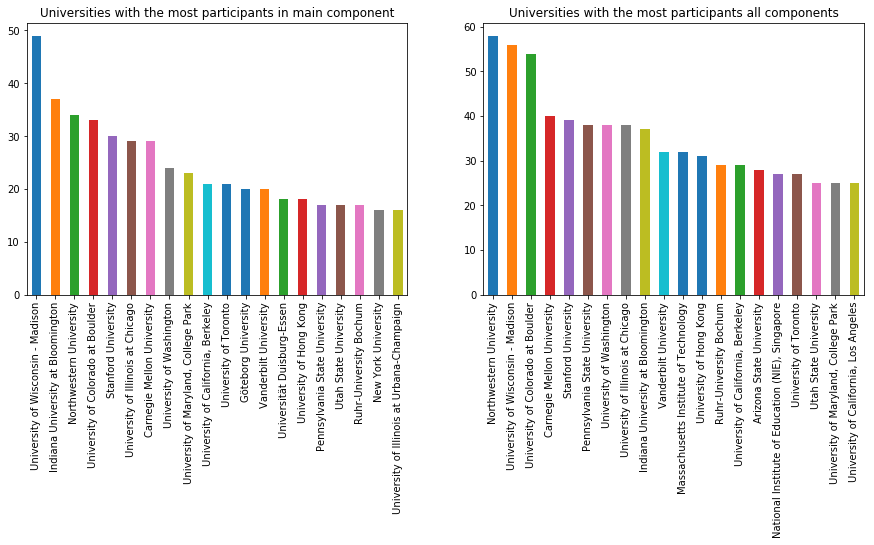

In [46]:
plt.figure(figsize=(15, 5))
plt.subplot(121)
#plt.ylim([0, 60])
plt.title('Universities with the most participants in main component')
main_component.name.value_counts().head(20).plot(kind='bar')
plt.subplot(122)
#plt.ylim([0, 60])
plt.title('Universities with the most participants all components')
universities[(universities.name != 'gmail') & (~universities.mail.duplicated())].name.value_counts().head(20).plot(kind='bar')
plt.show()

## Finding communities in the community: Modularity and Other measures

Constructing the graph with the largest component:

In [47]:
main_component = graph.subgraph(largest_cc)
mapping = nodes.long_name.to_dict()
main_component=nx.relabel_nodes(main_component,mapping)

Here we use modularity to detect communities, which will find subgraph that are unliquely to have developed "randomly".

From wikipedia:

>It was designed to measure the strength of division of a network into modules (also called groups, clusters or communities). Networks with high modularity have dense connections between the nodes within modules but sparse connections between nodes in different modules. Modularity is often used in optimization methods for detecting community structure in networks

In [48]:
c = list(greedy_modularity_communities(main_component))

We find 18 communities in total:

In [49]:
len(c)

29

In [50]:
#smallest community:
min(c, key=len)

frozenset({'Quignard, Matthieu', 'Tchounikine, Pierre', 'Wang, Patrick'})

## clique detection:


Here we look at large groups of researchers that all have collaborated within eachother.
Only look at connections with weight at least 3 -> at least 3 collaborations, froming a clique of at least 7 people.

In [51]:
mc = nx.from_numpy_array(np.where(nx.to_numpy_array(main_component) >= 3, 1, 0))

main_component_ =nx.relabel_nodes(mc, mapping)
large_cliques = [l for l in list(nx.find_cliques(main_component_)) if len(l) > 6]

large_cliques[0]

['Sayre, Eleanor C',
 'Sagy, Ornit',
 'Genz, Florian',
 'Xing, Chenmu',
 'Malkiewich, Laura J.',
 'Lee, Alison',
 'Slater, Stefan',
 'Mazziotti, Claudia']

We get a total of 12 groups:

In [52]:
len(large_cliques)

4

In [53]:
main_component_clique = nx.from_numpy_array(nx.to_numpy_array(main_component))

In [54]:
mc = nx.from_numpy_array(np.where(nx.to_numpy_array(main_component_clique) >=3, 1, 0))

In [55]:
large_cliques = [l for l in list(nx.find_cliques(mc)) if len(l) > 6]
color_cliques = {}
set_inclique = set()
for i, clique in enumerate(large_cliques):
    for member in clique:
        color_cliques[member] = i+1
        set_inclique.add(member)

In [56]:
for member in (set(main_component_clique.nodes)-set_inclique):
    color_cliques[member] = 0

Define colormap for better plotting:

   0  ||  1  ||  2  ||  3


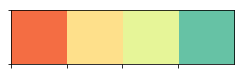

In [57]:
palette = sns.color_palette(palette='Spectral', n_colors=len(large_cliques))

sns.palplot(palette)
print('  ', '  ||  '.join([str(i) for i in list(range(len(large_cliques)))]))

In [58]:
colors = ['#C7C7C7'] + \
    sns.color_palette(palette='Spectral', n_colors=30).as_hex()

In [59]:
node_size = (np.array(list(nx.degree_centrality(main_component_clique).values())))
edge_color= np.array(list(nx.get_edge_attributes(main_component_clique, 'weight').values()))

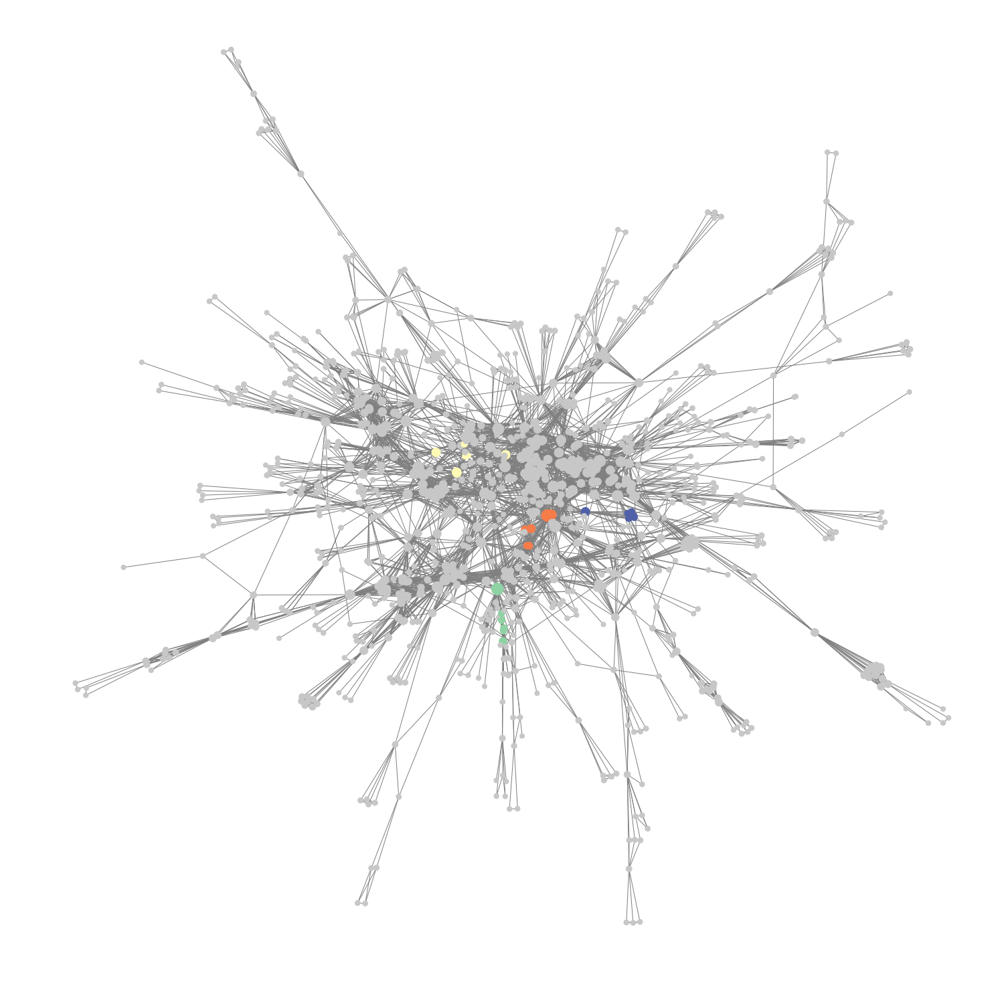

In [60]:
plt.figure(figsize=(20, 20))
nx.draw_spring(main_component_clique, node_color=pd.Series(color_cliques).sort_index().tolist(), 
              cmap=ListedColormap(colors),
              node_size=(node_size+node_size.mean())*5000,
               edge_color='grey',
               iterations=400)

In [61]:
color = {}
for i, clique in enumerate(large_cliques):
    for member in clique:
        color[member] = i+2

# Using modularity to identify communities:

In [68]:
mapping = nodes.long_name.to_dict()

c = list(greedy_modularity_communities(main_component))

We change the node size based on degree centrality, the larger the node the more collaborations the individual has:

In [69]:
def matching_by_criteria(c):
    member_label = {}
    for index, community in enumerate(c):
        members = list(community)
        for m in members:
            member_label[m] = index
    return member_label

In [70]:
member_label = matching_by_criteria(c)
nx.set_node_attributes(main_component, member_label, 'community')
node_colors = pd.Series(member_label).sort_index().tolist()
node_size = np.array(list(nx.degree_centrality(main_component).values()))

In [71]:
np.percentile(node_size, 98)

0.03593890386343217

   1  ||  2  ||  3  ||  4  ||  5  ||  6  ||  7  ||  8  ||  9  ||  10  ||  11  ||  12  ||  13  ||  14  ||  15  ||  16  ||  17  ||  18  ||  19  ||  20  ||  21  ||  22  ||  23  ||  24  ||  25  ||  26  ||  27  ||  28  ||  29


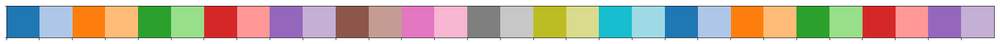

In [72]:
palette = sns.color_palette(palette='tab20', n_colors=len(c)+1)

sns.palplot(palette)
print('  ', '  ||  '.join([str(i) for i in list(range(1,len(c)+1))]))

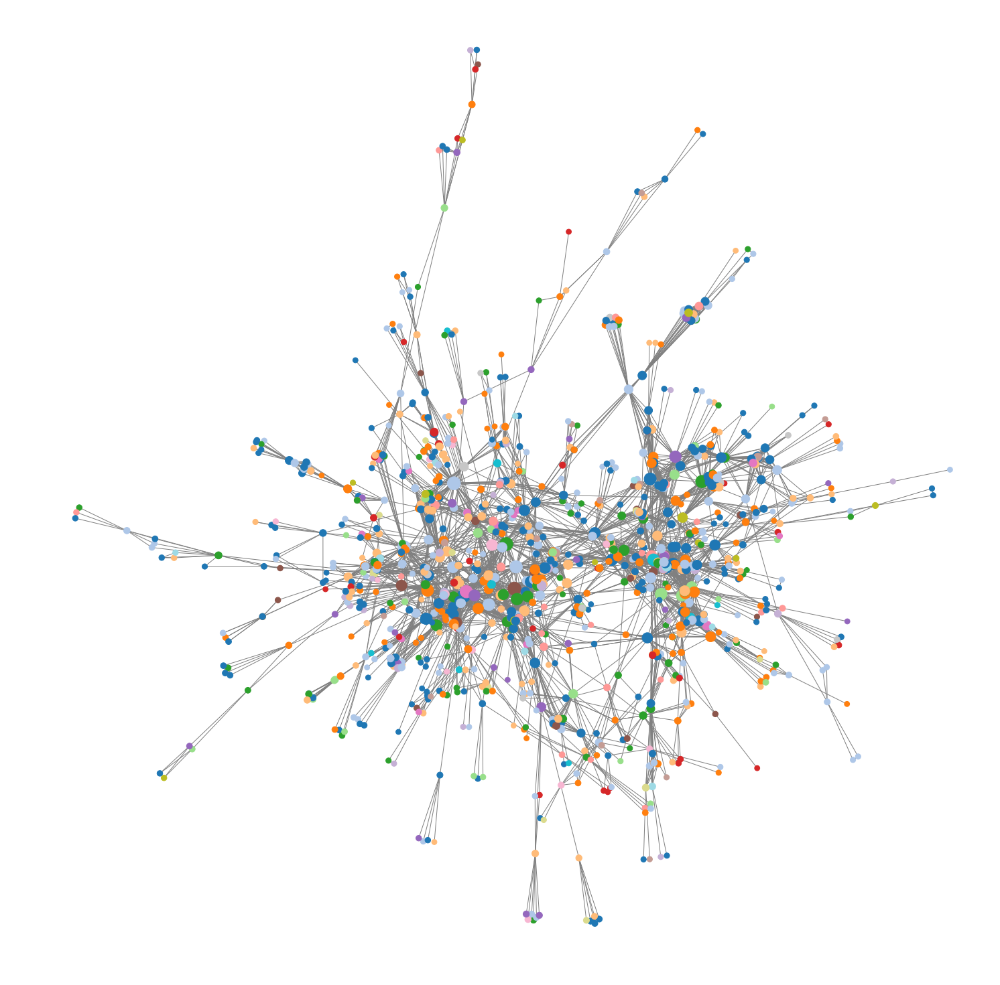

In [73]:
plt.figure(figsize=(20, 20))

nx.draw_spring(main_component, node_color=node_colors, 
                       cmap=ListedColormap(palette.as_hex()),
                       node_size=(node_size+node_size.mean())*6000,
                       #labels=labels,
               edge_color='grey',
               iterations=400
              )

plotting this geographically, we see that there is no clear geographical clustering belonging to these commuitues!

Here we have to code that allows to load this graph in Gephi.

As this graph is quite large, we build a smaller graph by cutting off outer nodes, and looking into the connector nodes:

In [78]:
G = nx.k_core(main_component, 12)

In [79]:
node_colors = pd.Series(member_label)[list(G.nodes())].sort_index().tolist()
node_size = np.array(list(nx.betweenness_centrality(G).values()))

In [80]:
people = pd.Series(mapping) 

In [81]:
persons_of_interest = pd.DataFrame(people[list(G.nodes())]).copy()
persons_of_interest['centrality'] = node_size

KeyError: 'None of [[\'Marshall, Stefanie Marshall\', \'Linn, Marcia\', \'Clegg, Tamara\', \'Bang, Megan\', \'Weinberger, Armin\', \'Lee, Christine\', \'Martinez-Maldonado, Roberto\', \'Adams, Deanne\', \'Adams, Jennifer D\', \'Järvenoja, Hanna\', \'Chiu, Jennifer\', \'de Laat, Maarten\', \'Lakhani, Heena\', \'Vinha, Telma\', \'Slotta, James D.\', \'Touioui, Ferdous\', \'Duncan, Ravit Golan\', \'Hansen, Jennifer\', \'Pennock, Phyllis Haugabook\', \'Pellegrino, James W\', \'Laurillard, Dianna\', \'Phillips, Abigail Leigh\', \'Sengupta, Pratim\', \'Slotta, Jim\', \'Phillips, Nathan C\', \'Georgen, Chris\', \'Rafaeli, Sheizaf\', \'Shehab, Saadeddine\', \'Israel, Maya\', \'Haganah, Sara\', \'Schwendimann, Beat A.\', \'Rummel, Nikol\', \'Shear, Linda\', \'Martin, Seth A.\', \'Melzner, Nadine\', \'Bedell, Kristin Dana Bedell\', \'Valcke, Martin\', \'Nijland, Femke\', \'de los Santos, Elizabeth Xeng\', \'Baker-Doyle, Kira J\', \'Fortus, David\', \'Gerard, Libby\', \'Kahn, Jennifer\', \'Weintrop, David\', \'Yoon, Susan A.\', \'Zaidi, Sania Zahra\', \'Lyons, Leila\', \'Walker, Justice Toshiba\', \'Lui, Debora\', \'Reeve, Richard\', \'Davis, Bria\', \'Bywater, Jim P\', \'Sheldon, Joshua\', \'Mustafaraj, Eni\', \'Chai, Shaoming\', \'Hajny, Nik\', \'de Jong, Frank\', \'Hopkins, Megan\', \'Rook, Michael M.\', \'Andrade, Alejandro\', \'Zhang, Jianwei\', \'Samarapungavan, Ala\', \'Byrne, Virginia L\', "O\'Connor, Kevin", \'Amzalag, Meital\', \'van Heijst, Hennie\', \'Price, Nancy\', \'Humburg, Megan\', \'Messina, Richard\', \'Paré, Dylan\', \'Bell, Adam\', \'Chan, Carol K.K.\', \'McDonald, Scott\', \'Van Keer, Hilde\', \'Shanahan, Marie-Claire\', \'Chen, Feng\', \'Jona, Kemi\', \'Anderson, Emma\', \'Marin, Ananda Maria\', \'Misra, Chandrani\', \'Hurwich, Talia A\', \'Clark, Doug\', \'Baram-Tsabari, Ayelet\', \'Greisel, Martin\', \'De Backer, Liesje\', \'Wise, Alyssa Friend\', \'Thompson, Jessica\', \'Froehlich, Jon E.\', \'Seitamaa-Hakkarainen, Pirita\', \'Walkington, Candace A\', \'Washington, Peter\', \'Barma, Sylvie\', \'Ryoo, Kihyun “Kelly”\', \'kang, Seokbin\', \'Hmelo-Silver, Cindy E.\', \'Kidron, Adi\', \'Kielstra, Jolique\', \'Zohar, Asnat R.\', \'Nathan, Mitchell\', \'Chen, Bodong\', \'Olsen, Al\', \'Martin, Caitlin Kennedy\', \'Brown, David\', \'Chattergoon, Rajendra\', \'Bild, David\', \'Fischer, Frank\', \'Hong, James\', \'Yang, Christine\', \'Berland, Matthew\', \'Quigley, David\', \'Briggs, Derek\', \'Tietjen, Phil\', \'Abrahamson, Dor\', \'Scardamalia, Marlene\', \'Vea, Tanner\', \'Suárez, Enrique\', \'Laferrière, Thérèse\', \'Davis, Richard\', \'Stromholt, Shelley\', \'Luce, Megan\', \'Peebles, Ben\', \'Forssell, Karin S.\', \'Cober, Rebecca\', \'Barton, Angela Calabrese\', \'Hall, Rogers\', \'Krajcik, Joe\', \'Gonzales, Wendy\', \'Klopfer, Eric\', \'Luehmann, April\', \'Adleberg, Barrie\', \'Stegmann, Karsten\', \'Mu, Jin\', \'Swearingen, Amanda\', \'Charles, Elizabeth S.\', \'Lee, Victor R.\', \'Blikstein, Paulo\', \'Lindgren, Robb\', \'Nordine, Jeffrey\', \'Bakker, Arthur\', \'Mercier, Emma\', \'Williams, Christopher A.\', \'Dresel, Markus\', \'Oshima, Jun\', \'Lund, Virginia Killian\', \'Shaw, Mia\', \'Allen, Shawndra\', \'Ben-Horin, Hava\', \'Shirouzu, Hajime\', \'Johnson, Raymond\', \'Sarmiento, Juan Pablo\', \'Barron, Brigid\', \'Levy, Sharona T.\', \'van den Ende, Joan\', \'Telhan, Orkan\', \'Grover, Shuchi\', \'Lin, Qinyun\', \'del Castillo, Fernando Diaz\', \'Teo, Chew Lee\', \'Miller, Katie A\', \'Azevedo, Roger\', \'Virk, Satyugjit\', \'McDermott, Raymond\', \'Jurow, A. Susan\', \'Vincent, Marie-Caroline\', \'Voyer, Samantha\', \'Melendez, Jose W.\', \'Harris, Christopher J.\', \'Sandoval, William A.\', \'Farnsworth, Jesse\', \'Eylon, Bat-Sheva\', \'Ng, Meixi\', \'Kali, Yael\', \'Hämäläinen, Raija\', \'Shirrell, Matthew\', \'Greenberg, Day\', \'Choi, Koun\', \'Chinn, Clark\', \'Sorensen, Clara\', \'Bereiter, Carl\', \'Levy, Keren S.\', \'Lenton, Kevin\', \'Tu, Xintian\', \'Quintana, Rebecca M\', \'Järvelä, Sanna\', \'McAuley, Alexander\', \'Rutstein, Daisy\', \'Elias, Nelly\', \'Sherman, Mark A\', \'Rahm, Jrene\', \'Matsuzawa, Yoshiaki\', \'Sagy, Ornit\', \'Murray, Julia\', \'Kapur, Manu\', \'Lindwall, Oskar\', \'Laslo, Esther\', \'Radinsky, Josh\', \'Snow, Eric\', \'Mudrick, Nicholas\', \'Malmberg, Jonna\', \'Dahn, Maggie\', \'Danish, Joshua A.\', \'Matuk, Camillia\', \'Barzilai, Sarit\', \'Kafai, Yasmin B.\', \'van Amersfoort, Daniël\', \'Yang, Diyi\', \'Nolan, Charlene Montano\', \'Godinez, Erick Velazquez\', \'Osborne, Jonathan\', \'Fong, Cresencia\', \'van Aalst, Jan\', \'Nunes, Cesar\', \'Whitfield, Latricia Chanel Whitfield\', \'Lee, Irene\', \'Mommandi, Wagma\', \'Montané, Mireia\', \'Hod, Yotam\', \'Manz, Eve\', \'Plass, Jan L.\', \'Dillenbourg, Pierre\', \'Berland, Leema K.\', \'Kollar, Ingo\', \'Shapiro, R. Benjamin\', \'Spillane, James\', \'Maltese, Adam\', \'Moher, Tom\', \'Wingert, Kerri\', \'Enyedy, Noel\', \'Penuel, William\', \'Hakkarainen, Kai\', \'Tan, Seng Chee\', \'Tzou, Carrie\', \'Pinkard, Nichole\', \'Tabak, Iris\', \'Tissenbaum, Mike\', \'Brami, Uzi Zevik\', \'Hladik, Stephanie\', \'Conlin, Luke\', \'Wilensky, Uri\', \'Joyce-Gibbons, Andrew\', \'Roque, Ricarose\', \'Abelson, Hal\', \'Neumann, Knut\', \'Gardner, Stephanie\', \'Ben-Zvi, Dani\', \'Bumbacher, Engin\', \'Furtak, Erin Marie\', \'Taub, Michelle\', \'Seufert, Tina\', \'Davis, Katie\', \'Vitale, Jonathan\', \'Acosta, Alisa\', \'Boroujeni, Mina Shirvani\', \'kafai, yasmin\', \'Vossoughi, Shirin\', \'Kirschner, Paul\', \'Ratté, Sylvie\', \'Goldman, Shelley\', \'Toutkoushian, Emily\', \'Gane, Brian Douglas\', \'McNeill, Katherine L.\', \'Basu, Satabdi\', \'Chen, Mei-Hwa\', \'Molenaar, Inge\', \'Rosé, Carolyn\', \'Hovey, Christopher M\', \'Recker, Mimi\', \'Bell, Philip\', \'Jayathirtha, Gayithri\', \'Anderson, Charles W\', \'Frank, Kenneth A.\', \'Santo, Rafi\', \'Clase, Kari\', \'Pelaez, Nancy\', \'Schreurs, Bieke\', \'Duek, Oshra\', \'Norooz, Leyla\', \'Wen, Miaomiao\', \'Bielaczyc, Katerine\', \'Weiss, Patrice L. Tamar\', \'Sumner, Tamara\', \'Whittaker, Chris\', \'Temple, Will\', \'Kent, Carmel\', \'Wylie, Alison\', \'Saleh, Asmalina\', \'Horn, Mike\', \'Tal, Tali\', \'Riedel-Kruse, Ingmar\', \'Van Horne, Katie\', \'Cocco, Felipe\', \'Dugdale, Michael\', \'Severance, Samuel\']] are in the [index]'

In [82]:
persons_of_interest.centrality.quantile(.95)

NameError: name 'persons_of_interest' is not defined

In [ ]:
labels = persons_of_interest[persons_of_interest.centrality > persons_of_interest.centrality.quantile(.92)]
labels = labels[0]
labels = labels.to_dict()

In [ ]:
plt.figure(figsize=(20, 20))
nx.draw_spring(G, 
               node_color=node_colors, 
               cmap=ListedColormap(palette.as_hex()),
               node_size=node_size*2000,
                labels=labels,
               edge_color='grey',
               iterations=1000
              )

In [ ]:
nx.set_node_attributes(main_component, nodes.country.to_dict(), name='country')
nx.set_node_attributes(main_component, nodes.name.to_dict(), name='uni')
nx.set_node_attributes(main_component, nx.degree_centrality(graph), name='centrality')

#mapping = nodes.long_name.to_dict()
#main_component_names =nx.relabel_nodes(main_component,mapping)
#nx.write_gexf(H, 'data/main_coauthor_graph.gexf')
#nx.write_gpickle(main_component_names, 'data/coauthor_graph')

### Analyzing each subcomponent

We look at distribution of country and inst. inside these clusters (my it's associated members):

In [83]:
c = [x for x in c if len(x) > 20]

Cluster dist for cluster 1


ValueError: invalid literal for int() with base 10: 'McBride, Elizabeth A.'

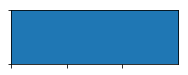

<Figure size 1440x1440 with 0 Axes>

In [84]:
for i,cluster in enumerate(c):
    print(f'Cluster dist for cluster {i+1}')
    sns.palplot(palette[i])
    
    plt.figure(figsize=(20, 20))
    data = nodes.iloc[list(cluster)].copy()
    draw_map_plot(data, palette.as_hex()[i])


    embedding = data.apply(lambda x: [x.Lon, x.Lat], axis=1)
    nx.draw_networkx_edges(main_component.subgraph(cluster),  pos = embedding, 
                           edge_color=palette.as_hex()[i], width = 2)
    
    plt.title('Network formed by community : {}'.format(i+1))
    plt.show()
    
    #adding inner cluster distribution plot
    plt.figure(figsize=(15,5))
    plt.subplot(121)
    nodes.iloc[list(cluster)].name.value_counts().head(20).plot('bar')
    plt.subplot(122)
    nodes.iloc[list(cluster)].country.value_counts().head(20).plot('bar')
    plt.show()
    
    #getting some concrete values
    print('Number of countries in cluster: ', len(nodes.iloc[list(cluster)].country.unique()))
    print('Number of institutions in cluster: ', len(nodes.iloc[list(cluster)].name.unique()))
    print('Number of people in cluster: ', len(nodes.iloc[list(cluster)].long_name.unique()))
    
    #plt.title('Number of people submitting over the years over the years')
    
   
    plot_df = pd.DataFrame(nodes.iloc[list(cluster)].groupby(['issued'])\
                           .country.value_counts()).rename(columns={'country':'count'}).reset_index()
    plot_df.pivot(index='issued', columns='country', values='count').plot(kind='bar', stacked=True, colormap=plt.cm.tab20)
    plt.title('Distribution of country participation over the years')
    plt.legend(bbox_to_anchor=(1, 1))
    
    plt.show()    
    


## An other way to partition the graph: Hierarchical clustering

NOT DONE YET

## Looking at people moving around

We now look at people who moved from one country to an other within the period of the papers in the parsed papers:

We have to look at years as well to avoid duplicates, however, this could be due to people being associated to multiple institutions at once.

In [85]:
name_country = associations[['name', 'mail', 'country', 'long_name', 'shortend_names','issued']]

In [86]:
#Add year to see
df = pd.merge(name_country, name_country, on='long_name').dropna()
df = df[df.shortend_names_x == df.shortend_names_y]
df = df[df.country_x != df.country_y]
df = df[df.issued_x <= df.issued_y]
df = df[~df[['long_name','name_x', 'name_y']].duplicated()]
df

,name_x,mail_x,country_x,long_name,shortend_names_x,issued_x,name_y,mail_y,country_y,shortend_names_y,issued_y
538,University of Toronto,jim.slotta@utoronto.ca,Canada,"Slotta, James D.",Slotta J. D.,2015,Boston College,slotta@bc.edu,United States,Slotta J. D.,2017
568,"Ontario Institute for Studies in Education, Un...",jslotta@gmail.com,Canada,"Slotta, James D.",Slotta J. D.,2016,Boston College,slotta@bc.edu,United States,Slotta J. D.,2017
909,Simon Fraser University,afw3@sfu.ca,Canada,"Wise, Alyssa Friend",Wise A. F.,2015,New York University,alyssa.wise@nyu.edu,United States,Wise A. F.,2017
2742,Carnegie Mellon University,ichounta@cs.cmu.edu,United States,"Chounta, Irene-Angelica",Chounta I.,2017,University of Tartu,angeliki.eirini.chounta@ut.ee,Estonia,Chounta I.,2018
3352,Göteborg University,yotamhod24@gmail.com,Sweden,"Hod, Yotam",Hod Y.,2016,University of Haifa,yhod@edu.haifa.ac.il,Israel,Hod Y.,2017
3358,University of Haifa,yhod@edu.haifa.ac.il,Israel,"Hod, Yotam",Hod Y.,2017,Göteborg University,yotamhod24@gmail.com,Sweden,Hod Y.,2018
8095,University of Hong Kong,yqyang@hku.hk,Hong Kong,"Yang, Yuqin",Yang Y.,2015,Central China Normal University,yuqinyang0904@gmail.com,China,Yang Y.,2018
8702,Universität des Saarlandes,a.weinberger@edutech.uni-saarland.de,Germany,"Weinberger, Armin",Tsovaltzi D.,2015,Hebrew University of Jerusalem,asterhan@mail.huji.ac.il,Israel,Tsovaltzi D.,2016
9952,EPFL - EPF Lausanne,kshitij.sharma@epfl.ch,Switzerland,"Sharma, Kshitij",Sharma K.,2015,Norwegian University of Science and Technology,kshitij.sharma@ntnu.no,Norway,Sharma K.,2018
10024,Université de Lausanne,kshitij.kshitij@unil.ch,Switzerland,"Sharma, Kshitij",Sharma K.,2016,Norwegian University of Science and Technology,kshitij.sharma@ntnu.no,Norway,Sharma K.,2018


we can see that within 4 years, a total of 20 repeat participants moved to universities in different countries!

In [87]:
df.shape

(18, 11)

In [88]:
new_homes = set(df.name_x).union(df.name_y)
len(new_homes)

27

In [89]:
movement_graph = nx.from_pandas_edgelist(df, source='name_x', 
                                         target='name_y', edge_attr=['long_name', 'issued_y'],
                                        create_using=nx.DiGraph)
names = list(movement_graph.nodes)

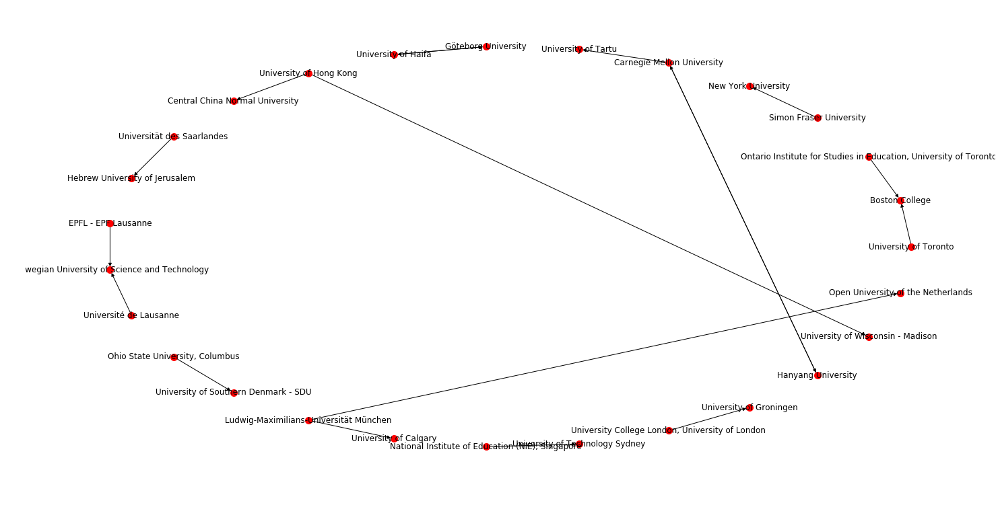

In [90]:
plt.figure(figsize=(20, 10))
nx.draw_circular(movement_graph, node_size=100,
                 labels=pd.DataFrame(names, names).to_dict()[0], 
                )

a total of 70 people change university overall all

In [91]:
#Add year to see
name_country = associations[associations.Lat.notna()][['name', 'mail', 'country', 'long_name', 'shortend_names','issued']]
df = pd.merge(name_country, name_country, on='long_name').dropna()
df = df[df.shortend_names_x == df.shortend_names_y]
df = df[df.name_x != df.name_y]
df = df[df.issued_x <= df.issued_y]
df = df[~df[['long_name','name_x', 'name_y']].duplicated()]
df.shape

(64, 11)

In [92]:
new_homes = set(df.name_x).union(df.name_y)
len(new_homes)

64

In [93]:
movement_graph = nx.from_pandas_edgelist(df, 
                                         source='name_x', 
                                         target='name_y', 
                                         edge_attr=['long_name', 'issued_y'], 
                                         create_using=nx.DiGraph)


In [94]:
name_loc_mapping = pd.DataFrame(associations[associations.name.isin(new_homes) & ~associations.name.duplicated()].name.copy())

In [95]:
name_loc_mapping['loc'] = associations[associations.name.isin(new_homes) & ~associations.name.duplicated()
                                      ].apply(lambda x: np.array([x.Lon, x.Lat]) , axis=1)

In [96]:
name_loc_mapping = name_loc_mapping.set_index('name')['loc'].to_dict()

In [97]:
nx.set_node_attributes(movement_graph,name_loc_mapping, 'pos')

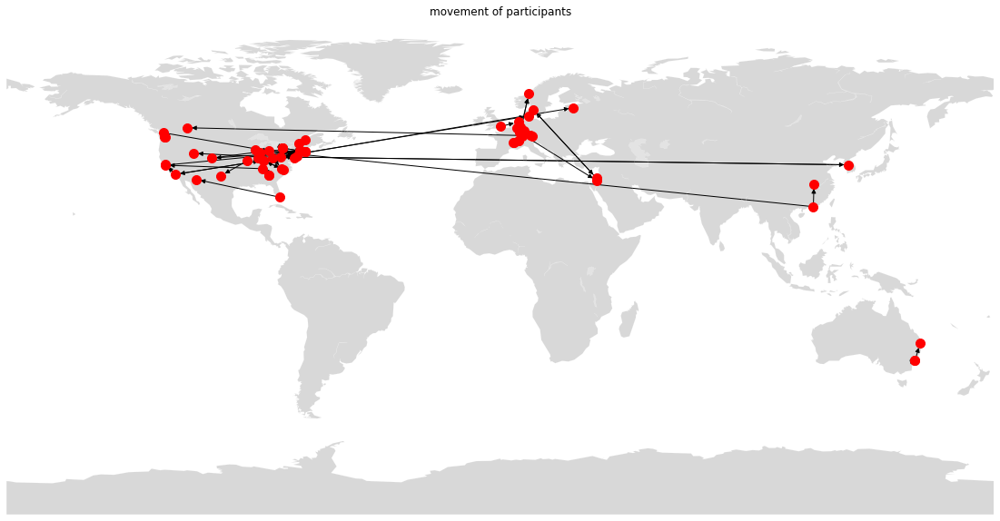

In [98]:
#
names = list(movement_graph.nodes)

plt.figure(figsize=(20, 10))
plt.title('movement of participants')
m=Basemap()
m.drawmapboundary(linewidth=0)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")
nx.draw(movement_graph, node_size=100,
        #labels=pd.DataFrame(names, names).to_dict()[0], 
        pos=nx.get_node_attributes(movement_graph, 'pos'),
        k = 1000)

## Looking at the network over the years

One interessting observation is that the ICLS years are much more dense and connected.

In [99]:
associations.issued.unique()

array([2018, 2016, 2015, 2017])

NameError: name 'draw_map_plot' is not defined

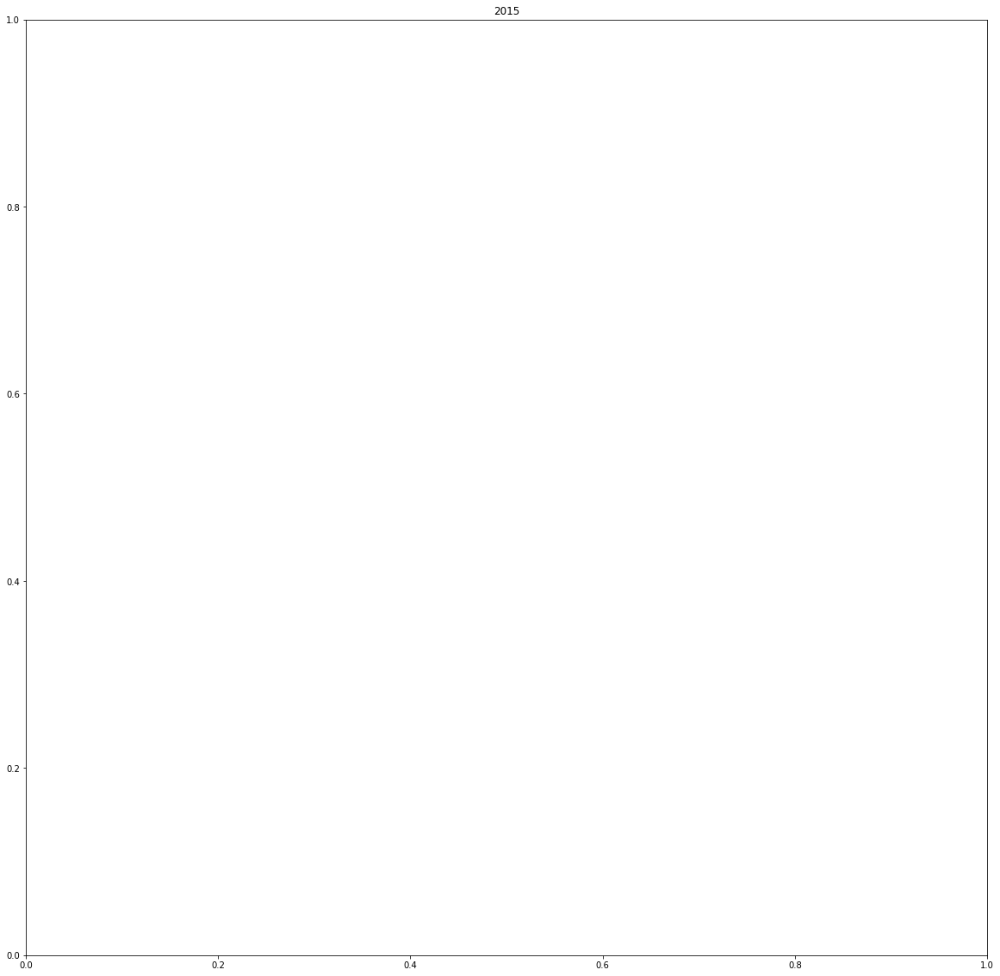

In [100]:
for year in sorted(associations.issued.unique()):

    
    #getting the data in shape to build the graph
    year_assoc = associations[(associations.country.notna()) & (associations.issued==year)]

    self_merge = pd.merge(year_assoc, year_assoc, on='file')
    self_merge = self_merge[self_merge.long_name_x != self_merge.long_name_y]


    nodes = year_assoc[~year_assoc.long_name.duplicated()].reset_index(drop=True).reset_index()
    name_index = nodes.long_name.to_dict()
    name_index = {v: k for k, v in name_index.items()}

    self_merge['source'] = self_merge.long_name_x.map(name_index)
    self_merge['target'] = self_merge.long_name_y.map(name_index)

    #building the graph
    adjacency = get_adjacency(nodes, self_merge)
    graph = nx.from_numpy_array(adjacency)

    #plot the map
    plt.figure(figsize=(20, 20))
    plt.title(year)
    data = nodes.copy()
    draw_map_plot(data, palette.as_hex()[i])


    #add the graph on top
    embedding = nodes.apply(lambda x: [x.Lon, x.Lat], axis=1)
    nx.draw_networkx_edges(graph,  pos = embedding, 
                           edge_color=palette.as_hex()[i], width = 1)
    plt.show()   
    
    
    #calculate graph theoretical measures
    nx.set_node_attributes(graph, nodes.country.to_dict(), name='country')
    nx.set_node_attributes(graph, nodes.name.to_dict(), name='uni')
    nx.set_node_attributes(graph, nx.degree_centrality(graph), name='centrality')

    print('Density of the graph : ' , nx.density(graph))
    comp = list(nx.connected_components(graph))
    largest_comp = max(comp, key=len)
    percentage_lcc = len(largest_comp)/ graph.number_of_nodes() * 100
    print('The largest component has ',
          len(largest_comp), 'nodes',
          'accounting for %.2f'% percentage_lcc, 
          '% of the nodes')
    lcc = graph.subgraph(largest_comp)
    diameter = nx.diameter(lcc)
    print("The diameter of the largest component is", diameter)
    print('Attribute Assortativity coef: Country: ', nx.attribute_assortativity_coefficient(graph, 'country'))
    print('Attribute Assortativity coef: Uni: ', nx.attribute_assortativity_coefficient(graph, 'uni'))
    

From the above we can deduce that:
1. the community is becomming less tight knit by the year (Density of graph, Diameter, Largest component)
2. something weird is going on in 2017, why is largest commponent so smal
3. There seems to be no string geographical linkage (country/uni) for collaboration (Attribute Assorativity Coefficient), which gives us how likely two nodes are linked given that they have the same attribute (country/uni)

## ICLS vs CSCL:

In [101]:
(associations.issued % 2 == 1).sum()

1088

NameError: name 'draw_map_plot' is not defined

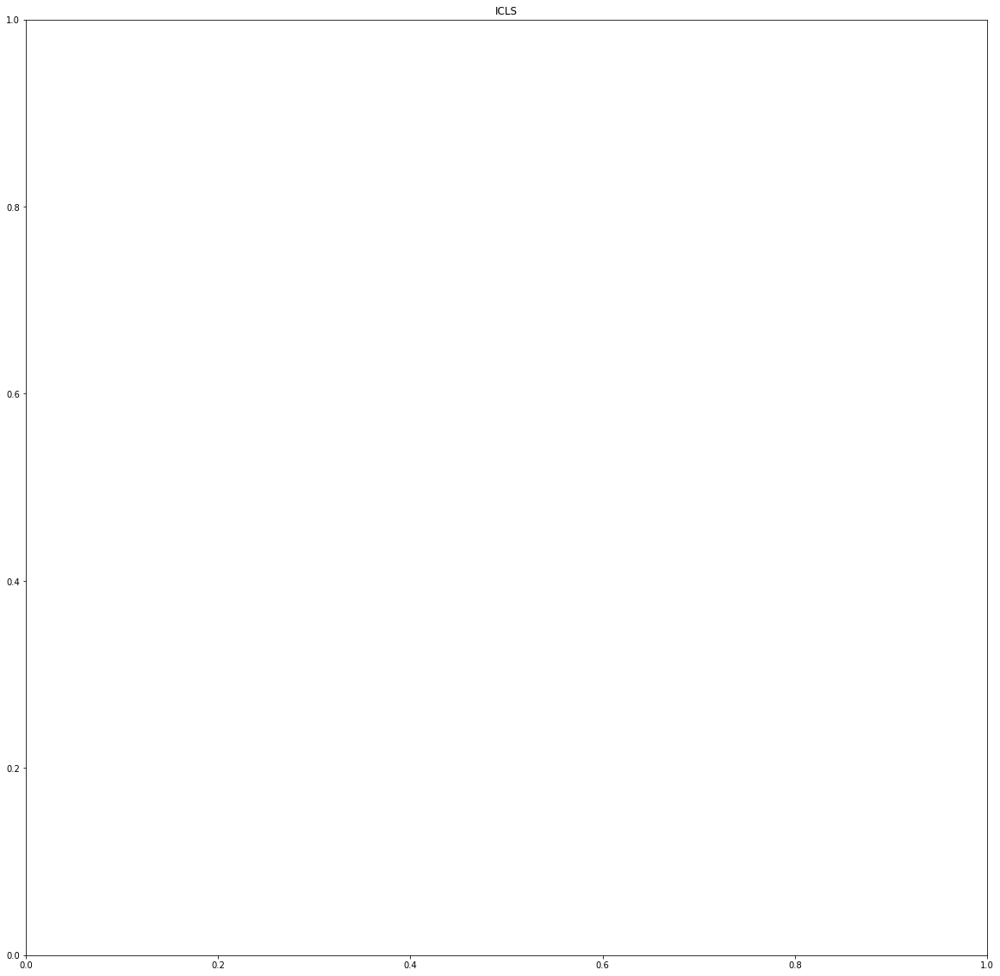

In [102]:
for i, title in enumerate(['ICLS', 'CSCL']):

    year_assoc = associations[(associations.issued % 2 == i)]

    self_merge = pd.merge(year_assoc, year_assoc, on='file')
    self_merge = self_merge[self_merge.long_name_x != self_merge.long_name_y]

    #edges = self_merge[['long_name_x', 'long_name_y', 'issued_x']].copy()

    nodes = year_assoc[~year_assoc.long_name.duplicated()].reset_index(drop=True).reset_index()
    name_index = nodes.long_name.to_dict()
    name_index = {v: k for k, v in name_index.items()}

    self_merge['source'] = self_merge.long_name_x.map(name_index)
    self_merge['target'] = self_merge.long_name_y.map(name_index)

    adjacency = get_adjacency(nodes, self_merge)
    graph = nx.from_numpy_array(adjacency)

    plt.figure(figsize=(20, 20))
    plt.title(title)
    data = nodes.copy()
    draw_map_plot(data, palette.as_hex()[i])


    embedding = nodes.apply(lambda x: [x.Lon, x.Lat], axis=1)
    nx.draw_networkx_edges(graph,  pos = embedding, 
                           edge_color=palette.as_hex()[i], width = 1)
    plt.show()   

    nx.set_node_attributes(graph, nodes.country.to_dict(), name='country')
    nx.set_node_attributes(graph, nodes.name.to_dict(), name='uni')
    nx.set_node_attributes(graph, nx.degree_centrality(graph), name='centrality')


    print('Density of the graph : ' , nx.density(graph))
    
    
    comp = list(nx.connected_components(graph))
    largest_comp = max(comp, key=len)
    
    percentage_lcc = len(largest_comp)/ graph.number_of_nodes() * 100
    print('The largest component has ',
          len(largest_comp), 'nodes',
          'accounting for %.2f'% percentage_lcc, 
          '% of the nodes')
    
    lcc_quak = graph.subgraph(largest_comp)
    diameter = nx.diameter(lcc_quak)
    print("The diameter of the largest component is", diameter)
    print('Attribute Assortativity coef: Country: ', nx.attribute_assortativity_coefficient(graph, 'country'))
    print('Attribute Assortativity coef: Uni: ', nx.attribute_assortativity_coefficient(graph, 'uni'))
    



From the path length in the largest component we see that the core-cummunity (as given by collaboration) of CSCL seems to be much more close knit than the icls community. Looking at the previous graphs with separation by years this may partially be due to the many new participants in 2018's icls, but as 2016's icls also has a larger diameter, this might be an underlying pattern that could be confirmed with more data.

## Re-examining 2018: how do nodes join?

In [103]:
previous_participation = set(associations[~associations.issued.isin([2018])].long_name.tolist())

year_assoc = associations[(associations.Lon.notna()) & (associations.issued == 2018)].copy()

year_assoc['prev'] = 0
year_assoc.loc[year_assoc.long_name.isin(previous_participation),'prev'] = 1

self_merge = pd.merge(year_assoc, year_assoc, on='file')
self_merge = self_merge[(self_merge.long_name_x != self_merge.long_name_y)]


nodes = year_assoc[~year_assoc.long_name.duplicated()].reset_index(drop=True).reset_index()
nodes = nodes[nodes.Lon.notna()]

name_index = nodes.long_name.to_dict()
name_index = {v: k for k, v in name_index.items()}



self_merge['source'] = self_merge.long_name_x.map(name_index)
self_merge['target'] = self_merge.long_name_y.map(name_index)


adjacency = get_adjacency(nodes, self_merge)
graph = nx.from_numpy_array(adjacency)

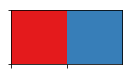

In [104]:
palette = sns.color_palette(palette='Set1', n_colors=2)

sns.palplot(palette)

We see that some of the new nodes joining in 2018 partly attach to people who already have participated in the conference in pervious years, while others join independently.

In red we have ned nodes, blue for old nodes.

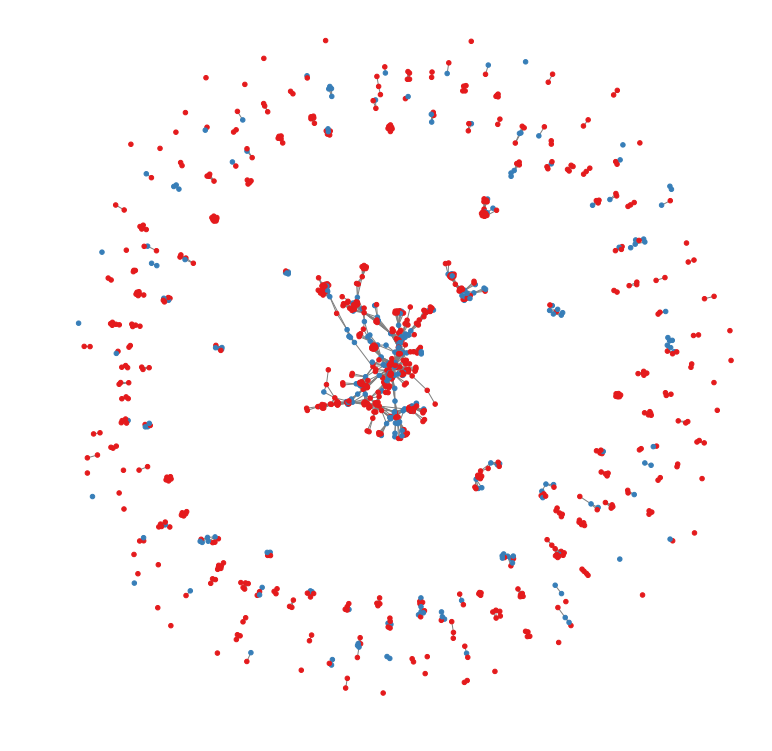

In [105]:
plt.figure(figsize=(10, 10))
nx.draw_spring(graph, cmap=ListedColormap(palette.as_hex()), 
               node_color=nodes.prev.tolist(), width = 1,  edge_color='grey', node_size=[20, 20])

We now analyze these mentors and mentees:

In [106]:
mentoring_connections = self_merge[['long_name_x', 'long_name_y', 'prev_x', 
                                    'prev_y', 'name_x', 'name_y', 'file',
                                   'country_x', 'country_y']]

mentees = mentoring_connections[(mentoring_connections.prev_x != mentoring_connections.prev_y) & 
                      (mentoring_connections.prev_x == 0)]

Number of people that co-authored a paper with somebody who already participated in the conference in previous years:

In [107]:
mentees.long_name_y.drop_duplicates().shape

(230,)

And the institutions they are affiliated with:

In [108]:
mentees[~mentees[['name_y', 'file']].duplicated()].name_y.value_counts().head(10)

Stanford University                      13
Indiana University at Bloomington        12
University of Hong Kong                  12
University of Colorado at Boulder        11
University of Wisconsin - Madison        10
Carnegie Mellon University                9
Northwestern University                   9
New York University                       8
University of Washington                  8
University of California, Los Angeles     7
Name: name_y, dtype: int64

In [109]:
mentees[~mentees[['country_y', 'file']].duplicated()].country_y.value_counts().head(10)

United States     133
Israel             13
Hong Kong          12
Germany            12
Canada              8
United Kingdom      6
Finland             6
Australia           5
Japan               5
Netherlands         5
Name: country_y, dtype: int64

The corresponding mentors:

In [110]:
mentees[~mentees[['long_name_x', 'file']].duplicated()].long_name_x.value_counts().head(10)

Silver, Cindy Hmelo      4
Horn, Mike               4
Moczek, Armin            3
Chinn, Clark             3
Thompson, Naomi          3
Davis, Bria              3
Walkington, Candace A    3
Zohar, Asnat R.          3
Tu, Xintian              3
Shaw, Mia                3
Name: long_name_x, dtype: int64

Looking at lone wolf participants:

In [111]:
def get_loners(mentoring_connections):
    loner_mask = (mentoring_connections.groupby('file').prev_x.sum() + mentoring_connections.groupby('file').prev_y.sum())
    loner_mask = loner_mask[loner_mask == 0].index.tolist()
    return mentoring_connections[mentoring_connections.file.isin(loner_mask)]

In [112]:
lone_wolfs = get_loners(mentoring_connections)

In [113]:
lone_wolfs.long_name_y.drop_duplicates().shape

(353,)

In [114]:
lone_wolfs[~lone_wolfs[['long_name_x', 'file']].duplicated()].long_name_x.value_counts().head()

Betser, Sagit                     3
Fitzgerald, Miranda S             3
Martin, Lee M                     3
Palincsar, Annemarie Palincsar    3
Brooks, Christopher               3
Name: long_name_x, dtype: int64

Here comes in the increase of americans in 2018!

In [115]:
lone_wolfs[~lone_wolfs[['name_x', 'file']].duplicated()].name_x.value_counts().head()

University of Michigan - Ann Arbor    6
University of Colorado at Boulder     5
University of Illinois at Chicago     5
Vanderbilt University                 4
Michigan State University             3
Name: name_x, dtype: int64

In [116]:
lone_wolfs[~lone_wolfs[['country_x', 'file']].duplicated()].country_x.value_counts().head(10)

United States         92
Germany                4
United Kingdom         4
Korea, Republic of     3
China                  2
Australia              2
Hong Kong              2
India                  2
Canada                 2
Norway                 2
Name: country_x, dtype: int64

We should also consider the number of papers, not only the number of participants:

In [117]:
mentees.file.unique().shape

(196,)

In [118]:
lone_wolfs.file.unique().shape

(120,)

In [119]:
mentoring_connections.file.unique().shape

(362,)

The number of papers written uniquely by veterans is then:

In [120]:
mentoring_connections.file.unique().shape[0] - (mentees.file.unique().shape[0]+lone_wolfs.file.unique().shape[0])

46

**We take this idea and apply it to the previous years to get a point of comparisoon:**

#### For 2017

In [121]:
previous_participation = set(associations[~associations.issued.isin([2018, 2017])].long_name.tolist())

year_assoc = associations[(associations.Lon.notna()) & (associations.issued == 2017)].copy()

year_assoc['prev'] = 0
year_assoc.loc[year_assoc.long_name.isin(previous_participation),'prev'] = 1

self_merge = pd.merge(year_assoc, year_assoc, on='file')
self_merge = self_merge[(self_merge.long_name_x != self_merge.long_name_y)]

In [122]:
mentoring_connections = self_merge[['long_name_x', 'long_name_y', 'prev_x', 
                                    'prev_y', 'name_x', 'name_y', 'file',
                                   'country_x', 'country_y']]

mentees = mentoring_connections[(mentoring_connections.prev_x != mentoring_connections.prev_y) & 
                      (mentoring_connections.prev_x == 0)]

Number of people that co-authored a paper with somebody who already participated in the conference in previous years:

In [123]:
mentees.long_name_y.drop_duplicates().shape

(95,)

And the institutions they are affiliated with:

In [124]:
mentees[~mentees[['name_y', 'file']].duplicated()].name_y.value_counts().head(10)

Carnegie Mellon University                5
University of Pennsylvania                4
University of Toronto                     4
Pennsylvania State University             4
Indiana University at Bloomington         4
State University of New York at Albany    4
University of Wisconsin - Madison         3
Shizuoka University                       3
University of Hong Kong                   3
Utah State University                     3
Name: name_y, dtype: int64

In [125]:
mentees[~mentees[['country_y', 'file']].duplicated()].country_y.value_counts().head(10)

United States    33
Germany           6
Japan             4
Canada            4
Switzerland       3
Hong Kong         3
Romania           2
Singapore         2
France            1
Finland           1
Name: country_y, dtype: int64

We see that in 2017, the number of new participants is much more consistend with numbers of incomming phd et. comming into the field.

Again, looking at lone wolf participants:

In [126]:
lone_wolfs = lone_wolfs = get_loners(mentoring_connections)
lone_wolfs.long_name_y.drop_duplicates().shape

(109,)

We also see much fewer lone wolf participants:

In [127]:
lone_wolfs[~lone_wolfs[['name_x', 'file']].duplicated()].name_x.value_counts().head()

University of Washington                           3
George Mason University                            3
University of Wisconsin - Madison                  3
University College London, University of London    3
University of Illinois at Chicago                  2
Name: name_x, dtype: int64

In [128]:
lone_wolfs[~lone_wolfs[['country_x', 'file']].duplicated()].country_x.value_counts().head(10)

United States     28
United Kingdom     4
Canada             3
Sweden             2
Germany            1
Cyprus             1
China              1
Brazil             1
Ireland            1
Name: country_x, dtype: int64

We should also consider the number of papers, not only the number of participants:

In [129]:
mentees.file.unique().shape

(48,)

In [130]:
lone_wolfs.file.unique().shape

(34,)

In [131]:
mentoring_connections.file.unique().shape

(101,)

The number of papers written uniquely by veterans is then:

In [132]:
mentoring_connections.file.unique().shape[0] - (mentees.file.unique().shape[0]+lone_wolfs.file.unique().shape[0])

19

#### For 2016

In [133]:
previous_participation = set(associations[~associations.issued.isin([2018, 2017, 2016])].long_name.tolist())

year_assoc = associations[(associations.Lon.notna()) & (associations.issued == 2016)].copy()

year_assoc['prev'] = 0
year_assoc.loc[year_assoc.long_name.isin(previous_participation),'prev'] = 1

self_merge = pd.merge(year_assoc, year_assoc, on='file')
self_merge = self_merge[(self_merge.long_name_x != self_merge.long_name_y)]

In [134]:
mentoring_connections = self_merge[['long_name_x', 'long_name_y', 'prev_x', 
                                    'prev_y', 'name_x', 'name_y', 'file',
                                   'country_x', 'country_y']]

mentees = mentoring_connections[(mentoring_connections.prev_x != mentoring_connections.prev_y) & 
                      (mentoring_connections.prev_x == 0)]

Number of people that co-authored a paper with somebody who already participated in the conference in previous years:

In [135]:
mentees.long_name_y.drop_duplicates().shape

(68,)

And the institutions they are affiliated with:

In [136]:
mentees[~mentees[['name_y', 'file']].duplicated()].name_y.value_counts().head(10)

University of California, Berkeley                                   6
Ludwig-Maximilians-Universität München                               5
University of Wisconsin - Madison                                    4
EPFL - EPF Lausanne                                                  3
Universität Augsburg                                                 3
Ruhr-University Bochum                                               3
Indiana University at Bloomington                                    3
Ontario Institute for Studies in Education, University of Toronto    2
University of Toronto                                                2
Göteborg University                                                  2
Name: name_y, dtype: int64

In [137]:
mentees[~mentees[['country_y', 'file']].duplicated()].country_y.value_counts().head(10)

United States    26
Germany           9
Canada            4
Switzerland       3
Australia         2
Sweden            2
Israel            2
Japan             1
Hong Kong         1
Taiwan            1
Name: country_y, dtype: int64

We see that in 2017, the number of new participants is much more consistend with numbers of incomming phd et. comming into the field.

Again, looking at lone wolf participants:

In [138]:
lone_wolfs = get_loners(mentoring_connections)
lone_wolfs.long_name_y.drop_duplicates().shape

(229,)

We also see much fewer lone wolf participants:

In [139]:
lone_wolfs[~lone_wolfs[['name_x', 'file']].duplicated()].name_x.value_counts().head()

University of Colorado at Boulder     6
Columbia University                   6
University of California, Berkeley    3
Northwestern University               3
University of New Mexico              3
Name: name_x, dtype: int64

In [140]:
lone_wolfs[~lone_wolfs[['country_x', 'file']].duplicated()].country_x.value_counts().head(10)

United States     54
United Kingdom     6
Netherlands        4
Germany            4
Israel             4
Singapore          3
Canada             3
Finland            3
China              3
Hong Kong          2
Name: country_x, dtype: int64

We should also consider the number of papers, not only the number of participants:

In [141]:
mentees.file.unique().shape

(42,)

In [142]:
lone_wolfs.file.unique().shape

(75,)

In [143]:
mentoring_connections.file.unique().shape

(130,)

The number of papers written uniquely by veterans is then:

In [144]:
mentoring_connections.file.unique().shape[0] - (mentees.file.unique().shape[0]+lone_wolfs.file.unique().shape[0])

13